<h3>Summary

Covid-19 is a viral disease caused by a novel coronavirus that emerged in Wuhan, China in December 2019. Since then, the disease has been spreading across the globe. As of June 30, 2020,  it had infected at least 10 million people and more than 500,000 had died from the complications of the disease. The United States had been one of the hardest hit countries with more than 2.6 million cases and more than 120,000 deaths. In an effort to control the spread of the disease, the vast majority of the countries had imposed mobility control in the form of mandatory stay-at-home order and had shut down domestic and international travel by March 2020.  In addition, large sectors of economy had been shut down, including travel, entertainment, and education. As a result of those disease mitigation matters, the world economy had been hard-hit and unemployment rates skyrocketed. As the world is desperate for the understanding of the virus and the disease it causes, disease modeling is critical to eventually control the spread of the disease. 
 

<h3>1. Introduction:

Covid-19 is a viral disease caused by a novel coronavirus that emerged in Wuhan, China in December 2019. Since then, the disease has been spreading across the globe. As of June 30, 2020,  it had infected at least 10 million people and more than 500,000 had died from the complications of the disease. The United States had been one of the hardest hit countries with more than 2.6 million cases and more than 120,000 deaths. In an effort to control the spread of the disease, the vast majority of the countries had imposed mobility control in the form of mandatory stay-at-home order and had shut down domestic and international travel by March 2020.  In addition, large sectors of economy had been shut down, including travel, entertainment, and education. As a result of those disease mitigation matters, the world economy had been hard-hit and unemployment rates skyrocketed. As the world is desperate for the understanding of the virus and the disease it causes, disease modeling is critical to eventually control the spread of the disease. 


Problem Statement: 
 
We seek to predict Covid-19 hotspots based on current infection level, movement data, health ranking and social vulnerability index. Secondly, we want to predict Covid-19 case fatality rate based on health ranking and social vulnerability index. 



Datasets:

We will build our prediction based on five public available datasets in "Uncover Covid-19 Challenge" from Roche Data Science Coalition posted on www.kaggle.com . Specifically, they are

Confirmed Covid-19 cases between 1/22/2020 and 4/28/2020 in 3130 US counties (308,210 observations, 9 features). 

Confirmed Covid-19 related deaths between 1/22/2020 and 4/28/2020 in 3130 US counties (308,210 observations, 9 features). 

US county health rankings in 2020 in 3142 counties (3142 observations, 507 features). 

CDC social vulnerability index in 2016 in 3142 us counties(3142 observations, 127 features).

Google mobility data between 02/15/2020 and 04/11/2020 in 2818 US counties (152,096 observations, 9 features).


<h3> 2. Data wrangling 

In [1]:
#import modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time

#display plots inline
%matplotlib inline

#ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
#import the raw datasets
raw_case = pd.read_csv('/Users/zhengzhang/Downloads/confirmed-covid-19-cases-in-us-by-state-and-county.csv')
raw_death = pd.read_csv('/Users/zhengzhang/Downloads/confirmed-covid-19-deaths-in-us-by-state-and-county.csv')
raw_mobility= pd.read_csv('/Users/zhengzhang/Downloads/us-mobility.csv')
raw_health= pd.read_csv('/Users/zhengzhang/Downloads/us-county-health-rankings-2020.csv')
raw_social = pd.read_csv('/Users/zhengzhang/Downloads/cdcs-social-vulnerability-index-svi-2016-overall-svi-county-level.csv')

In [3]:
#raw case info
raw_case.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 313110 entries, 0 to 313109
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   county_fips  313110 non-null  int64  
 1   county_name  313110 non-null  object 
 2   state_name   313110 non-null  object 
 3   state_fips   313110 non-null  int64  
 4   date         313110 non-null  object 
 5   confirmed    313110 non-null  int64  
 6   lat          307916 non-null  float64
 7   long         307916 non-null  float64
 8   geometry     307916 non-null  object 
dtypes: float64(2), int64(3), object(4)
memory usage: 21.5+ MB


In [4]:
#inspect the raw case dataset, the first five rows
raw_case.head()

,county_fips,county_name,state_name,state_fips,date,confirmed,lat,long,geometry
0,0,Statewide Unallocated,AL,1,2020-01-22,0,NaN,NaN,NaN
1,0,Statewide Unallocated,AL,1,2020-01-23,0,NaN,NaN,NaN
2,0,Statewide Unallocated,AL,1,2020-01-24,0,NaN,NaN,NaN
3,0,Statewide Unallocated,AL,1,2020-01-25,0,NaN,NaN,NaN
4,0,Statewide Unallocated,AL,1,2020-01-26,0,NaN,NaN,NaN


In [5]:
# keep four variables from individual counties
case=raw_case[['county_name','state_name','date','confirmed']][raw_case['county_name']!='Statewide Unallocated']
case.head()

,county_name,state_name,date,confirmed
98,Autauga County,AL,2020-01-22,0
99,Autauga County,AL,2020-01-23,0
100,Autauga County,AL,2020-01-24,0
101,Autauga County,AL,2020-01-25,0
102,Autauga County,AL,2020-01-26,0


In [6]:
#Rename the "state" and "county" variables
case['county']=case['county_name'].apply(lambda x:x.split(' Count')[0])
case=case.drop(['county_name'],axis=1)
case.rename(columns={'state_name':'st_abbr'},inplace=True)
case.head()

,st_abbr,date,confirmed,county
98,AL,2020-01-22,0,Autauga
99,AL,2020-01-23,0,Autauga
100,AL,2020-01-24,0,Autauga
101,AL,2020-01-25,0,Autauga
102,AL,2020-01-26,0,Autauga


In [7]:
# final case variable, total 308,210 observations
case.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 308210 entries, 98 to 313109
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   st_abbr    308210 non-null  object
 1   date       308210 non-null  object
 2   confirmed  308210 non-null  int64 
 3   county     308210 non-null  object
dtypes: int64(1), object(3)
memory usage: 11.8+ MB


In [8]:
#inspect the raw death dataset, there are 313,110 beneficiaries, 9 variables
raw_death.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 313110 entries, 0 to 313109
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   county_fips  313110 non-null  int64  
 1   county_name  313110 non-null  object 
 2   state_name   313110 non-null  object 
 3   state_fips   313110 non-null  int64  
 4   date         313110 non-null  object 
 5   deaths       313110 non-null  int64  
 6   lat          307916 non-null  float64
 7   long         307916 non-null  float64
 8   geometry     307916 non-null  object 
dtypes: float64(2), int64(3), object(4)
memory usage: 21.5+ MB


In [9]:
#inspect the death dataset, the first five rows
raw_death.head()

,county_fips,county_name,state_name,state_fips,date,deaths,lat,long,geometry
0,0,Statewide Unallocated,AL,1,2020-01-22,0,NaN,NaN,NaN
1,0,Statewide Unallocated,AL,1,2020-01-23,0,NaN,NaN,NaN
2,0,Statewide Unallocated,AL,1,2020-01-24,0,NaN,NaN,NaN
3,0,Statewide Unallocated,AL,1,2020-01-25,0,NaN,NaN,NaN
4,0,Statewide Unallocated,AL,1,2020-01-26,0,NaN,NaN,NaN


In [10]:
# keep four variables from individual counties
death=raw_death[['county_name','state_name','date','deaths']][raw_death['county_name']!='Statewide Unallocated']

In [11]:
# Rename the state_name and county_name
death.rename(columns={'state_name':'st_abbr'},inplace=True)
death['county']=death['county_name'].apply(lambda x:x.split(' Count')[0])
death=death.drop(['county_name'],axis=1)
death.head()

,st_abbr,date,deaths,county
98,AL,2020-01-22,0,Autauga
99,AL,2020-01-23,0,Autauga
100,AL,2020-01-24,0,Autauga
101,AL,2020-01-25,0,Autauga
102,AL,2020-01-26,0,Autauga


In [12]:
#inspect the death dataset info, 308,210 observations
death.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 308210 entries, 98 to 313109
Data columns (total 4 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   st_abbr  308210 non-null  object
 1   date     308210 non-null  object
 2   deaths   308210 non-null  int64 
 3   county   308210 non-null  object
dtypes: int64(1), object(3)
memory usage: 11.8+ MB


<h4> Merge the two covid datasets

In [13]:
covid=pd.merge(case,death)

In [14]:
#inspect the mobility dataset, there are 155,060 claims, 9 variables
raw_mobility.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155060 entries, 0 to 155059
Data columns (total 9 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   state                 155060 non-null  object 
 1   county                155060 non-null  object 
 2   date                  155060 non-null  object 
 3   retail                133393 non-null  float64
 4   grocery_and_pharmacy  129022 non-null  float64
 5   parks                 40611 non-null   float64
 6   transit_stations      59546 non-null   float64
 7   workplaces            146031 non-null  float64
 8   residential           72058 non-null   float64
dtypes: float64(6), object(3)
memory usage: 10.6+ MB


In [15]:
#inspect the mobility dataset, the first five rows
raw_mobility.head()

,state,county,date,retail,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
0,Total,Total,2020-02-15,6.0,2.0,15.0,3.0,2.0,-1.0
1,Total,Total,2020-02-16,7.0,1.0,16.0,2.0,0.0,-1.0
2,Total,Total,2020-02-17,6.0,0.0,28.0,-9.0,-24.0,5.0
3,Total,Total,2020-02-18,0.0,-1.0,6.0,1.0,0.0,1.0
4,Total,Total,2020-02-19,2.0,0.0,8.0,1.0,1.0,0.0


In [16]:
#delete the "Total" rows
mobility=raw_mobility[(raw_mobility['county']!='Total')]

In [17]:
#change the "state" to upper case
mobility['state']=mobility['state'].str.upper()

In [18]:
#change the "county" variable by dropping the word "County"
mobility['county']=mobility['county'].apply(lambda x:x.split(' Count')[0])
mobility.head()

,state,county,date,retail,grocery_and_pharmacy,parks,transit_stations,workplaces,residential
114,ALABAMA,Autauga,2020-02-15,5.0,7.0,NaN,NaN,-4.0,NaN
115,ALABAMA,Autauga,2020-02-16,0.0,1.0,-23.0,NaN,-4.0,NaN
116,ALABAMA,Autauga,2020-02-17,8.0,0.0,NaN,NaN,-27.0,5.0
117,ALABAMA,Autauga,2020-02-18,-2.0,0.0,NaN,NaN,2.0,0.0
118,ALABAMA,Autauga,2020-02-19,-2.0,0.0,NaN,NaN,2.0,0.0


In [19]:
#inspect mobility
mobility.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 152096 entries, 114 to 155059
Data columns (total 9 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   state                 152096 non-null  object 
 1   county                152096 non-null  object 
 2   date                  152096 non-null  object 
 3   retail                130429 non-null  float64
 4   grocery_and_pharmacy  126058 non-null  float64
 5   parks                 37647 non-null   float64
 6   transit_stations      56582 non-null   float64
 7   workplaces            143067 non-null  float64
 8   residential           69094 non-null   float64
dtypes: float64(6), object(3)
memory usage: 11.6+ MB


In [20]:
#inspect the mobility dataset missing data, since there are more than 50% missing for parks, transit_stations
# and residential, we may not use those for the later analysis. We decided not to impute the missing data. 
pd.DataFrame(
    mobility.isnull().sum() / len(mobility)*100,
    columns=['% Missing Values']
)

,% Missing Values
state,0.000000
county,0.000000
date,0.000000
retail,14.245608
grocery_and_pharmacy,17.119451
parks,75.247870
transit_stations,62.798496
workplaces,5.936382
residential,54.572112


In [21]:
#inspect the health dataset, there are 3193 entires, 507 variables
raw_health.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3193 entries, 0 to 3192
Columns: 507 entries, fips to percent_rural
dtypes: float64(485), int64(14), object(8)
memory usage: 12.4+ MB


In [22]:
#inspect the health dataset the first five rows
raw_health.head()

,fips,state,county,num_deaths,years_of_potential_life_lost_rate,95percent_ci_low,95percent_ci_high,quartile,ypll_rate_aian,ypll_rate_aian_95percent_ci_low,...,percent_hispanic,num_non_hispanic_white,percent_non_hispanic_white,num_not_proficient_in_english,percent_not_proficient_in_english,95percent_ci_low_39,95percent_ci_high_39,percent_female,num_rural,percent_rural
0,1000,Alabama,NaN,81791.0,9942.794666,9840.535949,10045.053384,NaN,NaN,NaN,...,4.443264,3197324,65.413428,48517,1.061048,1.006759,1.115337,51.633032,1957932.0,40.963183
1,1001,Alabama,Autauga,791.0,8128.591190,7283.340731,8973.841649,1.0,NaN,NaN,...,2.965774,41316,74.308016,426,0.820225,0.347891,1.292558,51.448715,22921.0,42.002162
2,1003,Alabama,Baldwin,2967.0,7354.122530,6918.554269,7789.690790,1.0,NaN,NaN,...,4.646779,181201,83.111337,1068,0.543517,0.347271,0.739763,51.538377,77060.0,42.279099
3,1005,Alabama,Barbour,472.0,10253.573403,8782.217281,11724.929524,2.0,NaN,NaN,...,4.276355,11356,45.641252,398,1.631683,0.824903,2.438462,47.216752,18613.0,67.789635
4,1007,Alabama,Bibb,471.0,11977.539484,10344.064842,13611.014126,3.0,NaN,NaN,...,2.625000,16708,74.589286,57,0.268210,0.000000,0.807504,46.781250,15663.0,68.352607


In [23]:
#keep selected variables in the health dataset
health=raw_health[['state','county','num_deaths','years_of_potential_life_lost_rate','percent_fair_or_poor_health','percent_low_birthweight',
              'percent_smokers','percent_driving_deaths_with_alcohol_involvement','percent_adults_with_obesity','percent_physically_inactive',
               'percent_excessive_drinking','percent_uninsured','primary_care_physicians_rate','percent_severe_housing_problems','life_expectancy','percent_homeowners',
               'percent_rural']].dropna(subset=['county'])
health['state']=health['state'].str.upper()
#health['county']=health['county'].str.join('County')
health.head()

,state,county,num_deaths,years_of_potential_life_lost_rate,percent_fair_or_poor_health,percent_low_birthweight,percent_smokers,percent_driving_deaths_with_alcohol_involvement,percent_adults_with_obesity,percent_physically_inactive,percent_excessive_drinking,percent_uninsured,primary_care_physicians_rate,percent_severe_housing_problems,life_expectancy,percent_homeowners,percent_rural
1,ALABAMA,Autauga,791.0,8128.591190,20.882987,8.619529,18.081557,26.785714,33.3,34.7,15.026031,8.721686,45.04180,14.663462,76.879477,74.894625,42.002162
2,ALABAMA,Baldwin,2967.0,7354.122530,17.509134,8.345003,17.489033,30.769231,31.0,26.5,17.958310,11.333404,72.89727,13.566201,78.450258,73.619343,42.279099
3,ALABAMA,Barbour,472.0,10253.573403,29.591802,11.474559,21.999985,40.000000,41.7,23.5,12.844016,12.242792,31.65809,14.583333,75.341935,61.397779,67.789635
4,ALABAMA,Bibb,471.0,11977.539484,19.439724,10.308710,19.114200,27.586207,37.6,33.5,15.570042,10.206253,48.52656,10.496454,73.571820,75.073099,68.352607
5,ALABAMA,Blount,1085.0,11335.071134,21.745293,7.604563,19.208672,19.444444,33.8,30.3,14.230594,13.360759,22.40877,10.548012,74.145826,78.626214,89.951502


In [24]:
#inspect health
health.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3142 entries, 1 to 3192
Data columns (total 17 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   state                                            3142 non-null   object 
 1   county                                           3142 non-null   object 
 2   num_deaths                                       2849 non-null   float64
 3   years_of_potential_life_lost_rate                2849 non-null   float64
 4   percent_fair_or_poor_health                      3142 non-null   float64
 5   percent_low_birthweight                          3035 non-null   float64
 6   percent_smokers                                  3142 non-null   float64
 7   percent_driving_deaths_with_alcohol_involvement  3107 non-null   float64
 8   percent_adults_with_obesity                      3142 non-null   float64
 9   percent_physically_inactive   

In [25]:
#inspect the health dataset missing data. We decided not to impute the missing data. 
pd.DataFrame(
    health.isnull().sum() / len(health)*100,
    columns=['% Missing Values']
)

,% Missing Values
state,0.000000
county,0.000000
num_deaths,9.325271
years_of_potential_life_lost_rate,9.325271
percent_fair_or_poor_health,0.000000
percent_low_birthweight,3.405474
percent_smokers,0.000000
percent_driving_deaths_with_alcohol_involvement,1.113940
percent_adults_with_obesity,0.000000
percent_physically_inactive,0.000000


In [26]:
#inspect social dataset, 3142 entries, 127 variables
raw_social.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3142 entries, 0 to 3141
Columns: 127 entries, geometry to shape_len
dtypes: float64(63), int64(39), object(25)
memory usage: 3.0+ MB


In [27]:
#inspect social dataset
raw_social.head()

,geometry,st,state,st_abbr,county,fips,location,area_sqmi,e_totpop,m_totpop,...,f_theme4,f_total,e_uninsur,m_uninsur,ep_uninsur,mp_uninsur,e_daypop,objectid,shape_are,shape_len
0,"POLYGON ((-86.9212008685 32.6575481071, -86.92...",1,ALABAMA,AL,Autauga,1001,"Autauga County, Alabama",594.446120,55049,0,...,f,f,4852,649,8.9,1.2,40854,1,0.150260,2.052636
1,"POLYGON ((-86.963362945 33.8582273591, -86.959...",1,ALABAMA,AL,Blount,1009,"Blount County, Alabama",644.806508,57704,0,...,f,f,6388,740,11.2,1.3,42597,2,0.164406,2.392672
2,"POLYGON ((-85.5934395044 32.8972732071, -85.59...",1,ALABAMA,AL,Chambers,1017,"Chambers County, Alabama",596.531112,34018,0,...,f,f,3979,544,11.8,1.6,27940,3,0.150587,1.714193
3,"POLYGON ((-86.1963696041 31.4254368653, -86.19...",1,ALABAMA,AL,Coffee,1031,"Coffee County, Alabama",678.985652,50991,0,...,f,f,5253,464,10.7,0.9,47236,4,0.167192,1.678611
4,"POLYGON ((-88.1392513191 34.5878014617, -88.13...",1,ALABAMA,AL,Colbert,1033,"Colbert County, Alabama",592.619664,54377,0,...,f,f,4932,458,9.1,0.8,56227,5,0.158869,2.175068


In [28]:
#keep 7 variables
social=raw_social[['state','st_abbr','county','ep_pov','ep_unemp','ep_age65','ep_minrty']]
social.isnull().sum()

state        0
st_abbr      0
county       0
ep_pov       0
ep_unemp     0
ep_age65     0
ep_minrty    0
dtype: int64

In [29]:
#inspect social dataset
social.head()

,state,st_abbr,county,ep_pov,ep_unemp,ep_age65,ep_minrty
0,ALABAMA,AL,Autauga,12.3,5.6,14.0,24.3
1,ALABAMA,AL,Blount,16.5,6.0,17.2,12.3
2,ALABAMA,AL,Chambers,20.3,7.5,18.4,43.3
3,ALABAMA,AL,Coffee,16.4,6.2,15.8,28.6
4,ALABAMA,AL,Colbert,16.5,7.5,18.5,21.1


<h3> 3. Exploratory data analysis

<h5> 3a. Univariate Analysis

In [30]:
# Check the total number of states, there are 51 states and DC
case['st_abbr'].unique()

array(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
       'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
       'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
       'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
       'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'], dtype=object)

In [31]:
covidstate=case['st_abbr'].unique()
len(covidstate)

51

In [32]:
unique_counties=case['county'].groupby(case['st_abbr']).unique()
unique_counties

st_abbr
AK    [Aleutians East Borough, Aleutians West Census...
AL    [Autauga, Baldwin, Barbour, Bibb, Blount, Bull...
AR    [Arkansas, Ashley, Baxter, Benton, Boone, Brad...
AZ    [Apache, Cochise, Coconino, Gila, Graham, Gree...
CA    [Grand Princess Cruise Ship, Alameda, Alpine, ...
CO    [Adams, Alamosa, Arapahoe, Archuleta, Baca, Be...
CT    [Fairfield, Hartford, Litchfield, Middlesex, N...
DC                                         [Washington]
DE                           [Kent, New Castle, Sussex]
FL    [Alachua, Baker, Bay, Bradford, Brevard, Browa...
GA    [Appling, Atkinson, Bacon, Baker, Baldwin, Ban...
HI             [Hawaii, Honolulu, Kalawao, Kauai, Maui]
IA    [Adair, Adams, Allamakee, Appanoose, Audubon, ...
ID    [Ada, Adams, Bannock, Bear Lake, Benewah, Bing...
IL    [Adams, Alexander, Bond, Boone, Brown, Bureau,...
IN    [Adams, Allen, Bartholomew, Benton, Blackford,...
KS    [Allen, Anderson, Atchison, Barber, Barton, Bo...
KY    [Adair, Allen, Anderson, Ballard, 

In [33]:
#Total 3145 counties
sum=0
for i in range(0,51):
    sum=sum+len(unique_counties[i])
sum

3145

In [34]:
#There are 98 days worth of data, from Jan 22 to April 28, 2020
case['date'].value_counts()

2020-02-16    3145
2020-02-25    3145
2020-03-23    3145
2020-04-13    3145
2020-02-01    3145
              ... 
2020-04-07    3145
2020-02-18    3145
2020-02-19    3145
2020-01-30    3145
2020-02-02    3145
Name: date, Length: 98, dtype: int64

In [35]:
case['date'].unique()

array(['2020-01-22', '2020-01-23', '2020-01-24', '2020-01-25',
       '2020-01-26', '2020-01-27', '2020-01-28', '2020-01-29',
       '2020-01-30', '2020-01-31', '2020-02-01', '2020-02-02',
       '2020-02-03', '2020-02-04', '2020-02-05', '2020-02-06',
       '2020-02-07', '2020-02-08', '2020-02-09', '2020-02-10',
       '2020-02-11', '2020-02-12', '2020-02-13', '2020-02-14',
       '2020-02-15', '2020-02-16', '2020-02-17', '2020-02-18',
       '2020-02-19', '2020-02-20', '2020-02-21', '2020-02-22',
       '2020-02-23', '2020-02-24', '2020-02-25', '2020-02-26',
       '2020-02-27', '2020-02-28', '2020-02-29', '2020-03-01',
       '2020-03-02', '2020-03-03', '2020-03-04', '2020-03-05',
       '2020-03-06', '2020-03-07', '2020-03-08', '2020-03-09',
       '2020-03-10', '2020-03-11', '2020-03-12', '2020-03-13',
       '2020-03-14', '2020-03-15', '2020-03-16', '2020-03-17',
       '2020-03-18', '2020-03-19', '2020-03-20', '2020-03-21',
       '2020-03-22', '2020-03-23', '2020-03-24', '2020-

In [36]:
# Check the total number of states, there are 50 states
mobility['state'].unique()

array(['ALABAMA', 'ALASKA', 'ARIZONA', 'ARKANSAS', 'CALIFORNIA',
       'COLORADO', 'CONNECTICUT', 'DELAWARE', 'FLORIDA', 'GEORGIA',
       'HAWAII', 'IDAHO', 'ILLINOIS', 'INDIANA', 'IOWA', 'KANSAS',
       'KENTUCKY', 'LOUISIANA', 'MAINE', 'MARYLAND', 'MASSACHUSETTS',
       'MICHIGAN', 'MINNESOTA', 'MISSISSIPPI', 'MISSOURI', 'MONTANA',
       'NEBRASKA', 'NEVADA', 'NEW HAMPSHIRE', 'NEW JERSEY', 'NEW MEXICO',
       'NEW YORK', 'NORTH CAROLINA', 'NORTH DAKOTA', 'OHIO', 'OKLAHOMA',
       'OREGON', 'PENNSYLVANIA', 'RHODE ISLAND', 'SOUTH CAROLINA',
       'SOUTH DAKOTA', 'TENNESSEE', 'TEXAS', 'UTAH', 'VERMONT',
       'VIRGINIA', 'WASHINGTON', 'WEST VIRGINIA', 'WISCONSIN', 'WYOMING'],
      dtype=object)

In [37]:
mobilitystate=mobility['state'].unique()
len(mobilitystate)

50

In [38]:
#How many counties in each state
unique_counties=mobility['county'].groupby(mobility['state']).unique()
unique_counties

state
ALABAMA           [Autauga, Baldwin, Barbour, Bibb, Blount, Bull...
ALASKA            [Anchorage, Bethel, Fairbanks North Star, June...
ARIZONA           [Apache, Cochise, Coconino, Gila, Graham, Gree...
ARKANSAS          [Arkansas, Ashley, Baxter, Benton, Boone, Brad...
CALIFORNIA        [Alameda, Amador, Butte, Calaveras, Colusa, Co...
COLORADO          [Adams, Alamosa, Arapahoe, Archuleta, Bent, Bo...
CONNECTICUT       [Fairfield, Hartford, Litchfield, Middlesex, N...
DELAWARE                                 [Kent, New Castle, Sussex]
FLORIDA           [Alachua, Baker, Bay, Bradford, Brevard, Browa...
GEORGIA           [Appling, Atkinson, Bacon, Baldwin, Banks, Bar...
HAWAII                              [Hawaii, Honolulu, Kauai, Maui]
IDAHO             [Ada, Bannock, Bear Lake, Benewah, Bingham, Bl...
ILLINOIS          [Adams, Alexander, Bond, Boone, Bureau, Carrol...
INDIANA           [Adams, Allen, Bartholomew, Benton, Blackford,...
IOWA              [Adair, Allamakee, Appan

In [39]:
#Total 2818 counties
sum=0
for i in range(0,50):
    sum=sum+len(unique_counties[i])
sum

2818

In [40]:
mobility['date'].unique()

array(['2020-02-15', '2020-02-16', '2020-02-17', '2020-02-18',
       '2020-02-19', '2020-02-20', '2020-02-21', '2020-02-22',
       '2020-02-23', '2020-02-24', '2020-02-25', '2020-02-26',
       '2020-02-27', '2020-02-28', '2020-02-29', '2020-03-01',
       '2020-03-02', '2020-03-03', '2020-03-04', '2020-03-05',
       '2020-03-06', '2020-03-07', '2020-03-08', '2020-03-09',
       '2020-03-10', '2020-03-11', '2020-03-12', '2020-03-13',
       '2020-03-14', '2020-03-15', '2020-03-16', '2020-03-17',
       '2020-03-18', '2020-03-19', '2020-03-20', '2020-03-21',
       '2020-03-22', '2020-03-23', '2020-03-24', '2020-03-25',
       '2020-03-26', '2020-03-27', '2020-03-28', '2020-03-29',
       '2020-03-30', '2020-03-31', '2020-04-01', '2020-04-02',
       '2020-04-03', '2020-04-04', '2020-04-05', '2020-04-06',
       '2020-04-07', '2020-04-08', '2020-04-09', '2020-04-10',
       '2020-04-11'], dtype=object)

<h4> 3b. Plot the Covid and Mobility data for all US counties

<h4> Define a module to plot the covid cases for any of the 3145 counties

In [41]:
def plot_all_covid(data, st_abbr, type, a):
    statelist=data[data['st_abbr']==st_abbr]['county'].unique()
    if(len(statelist)>=6):
        f,axs=plt.subplots(2,3,figsize=(20,6))
        for i in range(1+a,7+a):
            state_county_covid=data[(data['st_abbr']==st_abbr)&(data['county']==statelist[i-1])]
            plt.subplot(2,3,i-a)
            plt.title(""+str(st_abbr)+" "+str(statelist[i-1])+" County "+str(type)+" Covid Cases") 
            plt.xlabel("Date")
            plt.ylabel("Number of Cases")
            plt.ylim(0,max(data[data['st_abbr']==st_abbr][str.lower(type)].dropna()))
            plt.tick_params(axis='x',which='both',bottom=True,top=False,labelbottom=False,grid_alpha=1)
            plt.plot(state_county_covid['date'],state_county_covid[type] )
    if(len(statelist)<6):
        f,axs=plt.subplots(1,len(statelist),figsize=(20,6))
        for i in range(1,len(statelist)+1):
            state_county_covid=data[(data['st_abbr']==st_abbr)&(data['county']==statelist[i-1])]
            plt.subplot(1,len(statelist),i)
            plt.title(""+str(st_abbr)+" "+str(statelist[i-1])+" County "+str(type)+" Covid Cases") 
            plt.xlabel("Date")
            plt.ylabel("Number of Cases")
            plt.ylim(0,max(data[data['st_abbr']==st_abbr][str.lower(type)].dropna()))
            plt.tick_params(axis='x',which='both',bottom=True,top=False,labelbottom=False,grid_alpha=1)
            plt.plot(state_county_covid['date'],state_county_covid[type] ) 

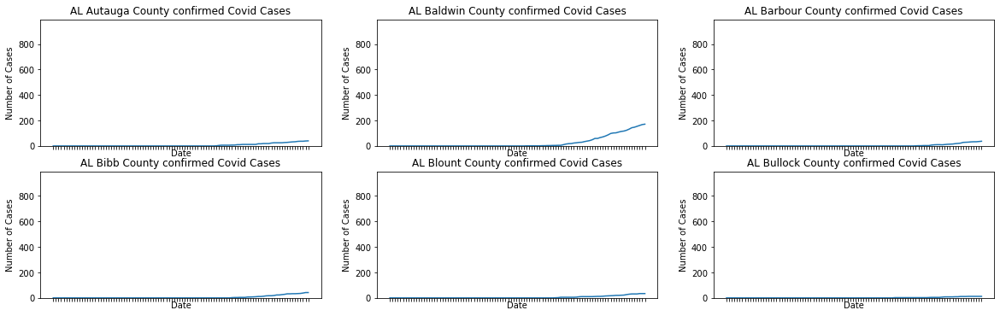

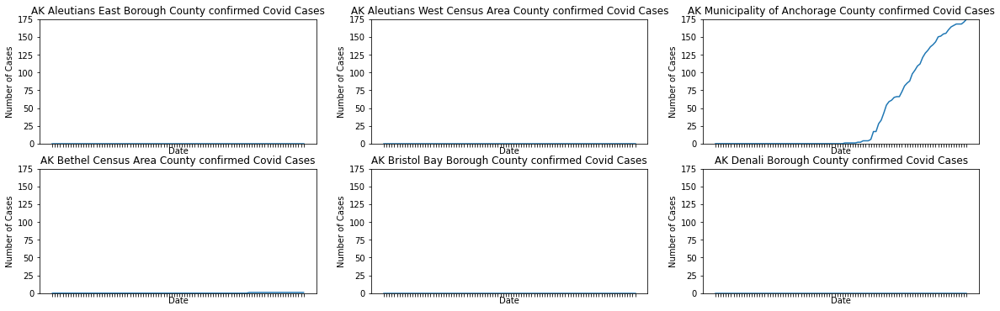

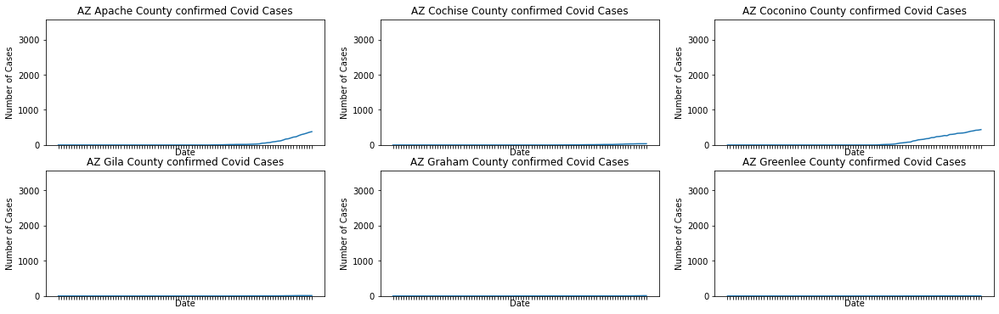

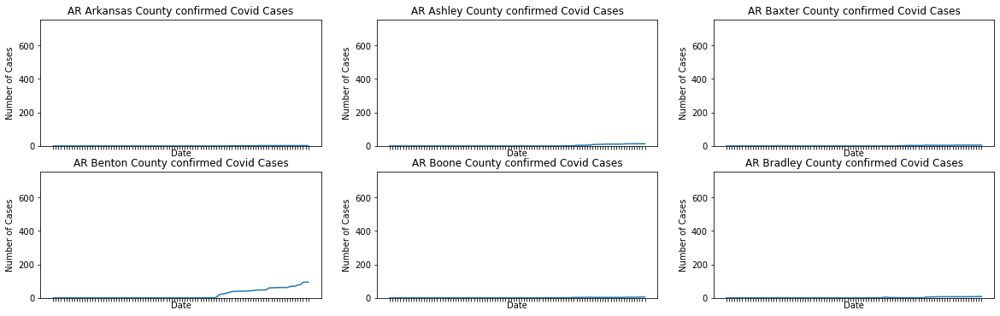

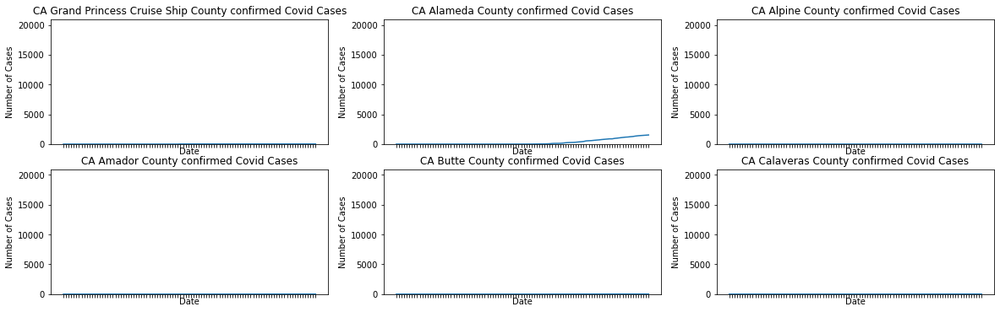

...

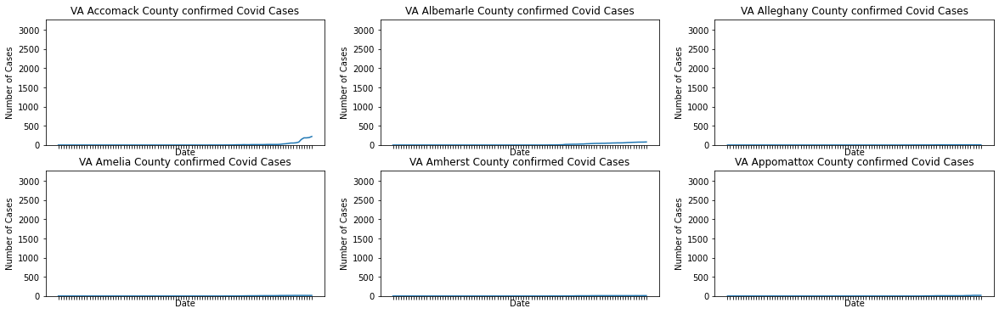

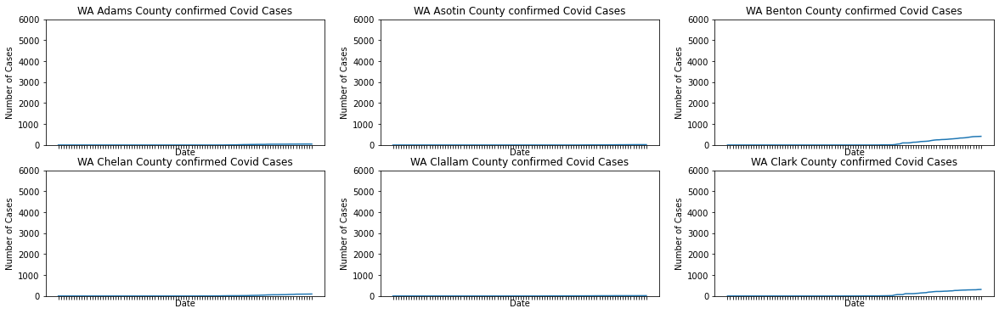

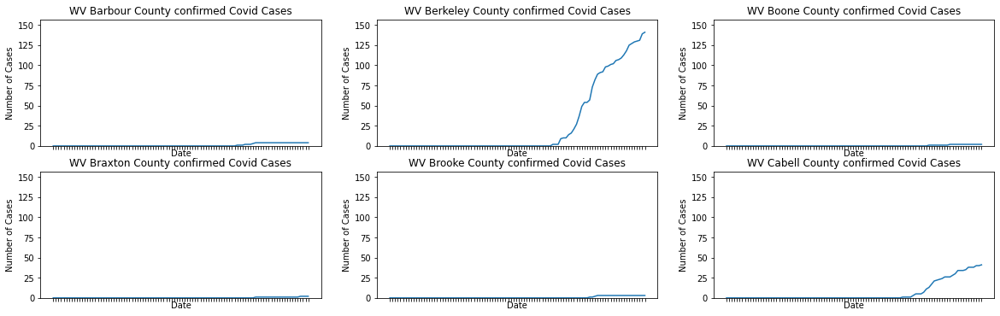

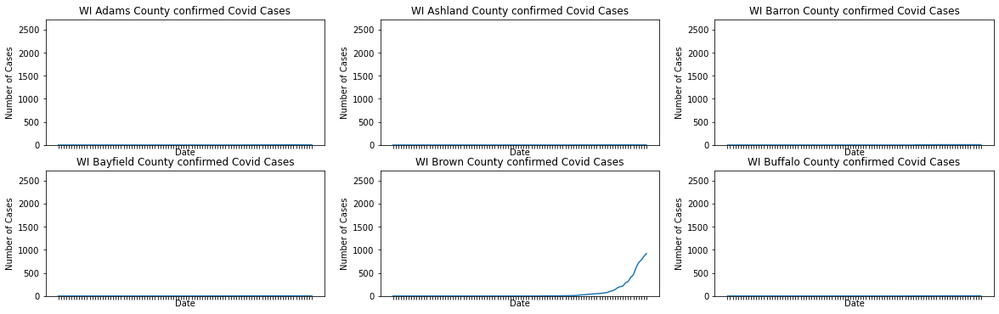

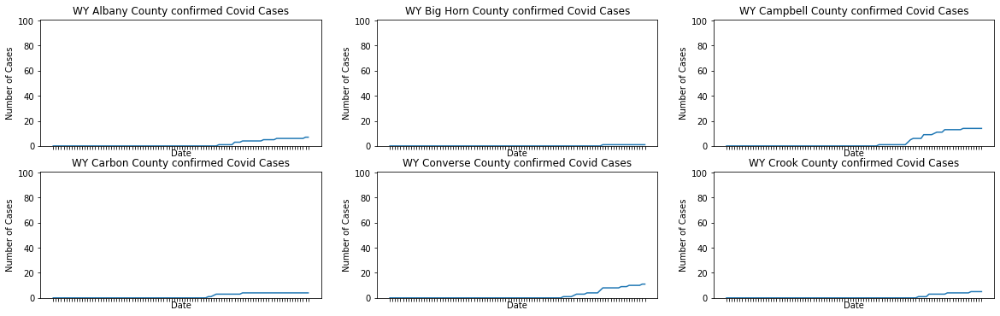

In [42]:
#Covid cases for the first 6 counties of the 51 states
for i in range(0,51):
    plot_all_covid(covid,covidstate[i],'confirmed',0)

<h4>Define a module to plot any type of mobility for any of the 2818 US counties

In [43]:
def plot_all(data, state, type, a):
    statelist=data[data['state']==state]['county'].unique()
    if(len(statelist)>=6):
        f,axs=plt.subplots(2,3,figsize=(20,6))
        for i in range(1+a,7+a):
            state_county_mob=data[(data['state']==state)&(data['county']==statelist[i-1])]
            plt.subplot(2,3,i-a)
            plt.title(""+str(state)+" "+str(statelist[i-1])+" County "+str(type)+" Mobility Plot") 
            plt.xlabel("Date")
            plt.ylabel("Mobility")
            plt.ylim(min(data[data['state']==state][str.lower(type)].dropna())-5,max(data[data['state']==state][str.lower(type)].dropna()))
            plt.tick_params(axis='x',which='both',bottom=True,top=False,labelbottom=False,grid_alpha=1)
            plt.plot(state_county_mob['date'][0:57],state_county_mob[str.lower(type)][0:57]) 
    if(len(statelist)<6):
        f,axs=plt.subplots(1,len(statelist),figsize=(20,6))
        for i in range(1,len(statelist)+1):
            state_county_mob=data[(data['state']==state)&(data['county']==statelist[i-1])]
            plt.subplot(1,len(statelist),i)
            plt.title(""+str(state)+" "+str(statelist[i-1])+" County "+str(type)+" Mobility Plot") 
            plt.xlabel("Date")
            plt.ylabel("Mobility")
            plt.ylim(min(data[data['state']==state][str.lower(type)].dropna())-5,max(data[data['state']==state][str.lower(type)].dropna()))
            plt.tick_params(axis='x',which='both',bottom=True,top=False,labelbottom=False,grid_alpha=1)
            plt.plot(state_county_mob['date'][0:57],state_county_mob[str.lower(type)][0:57])      

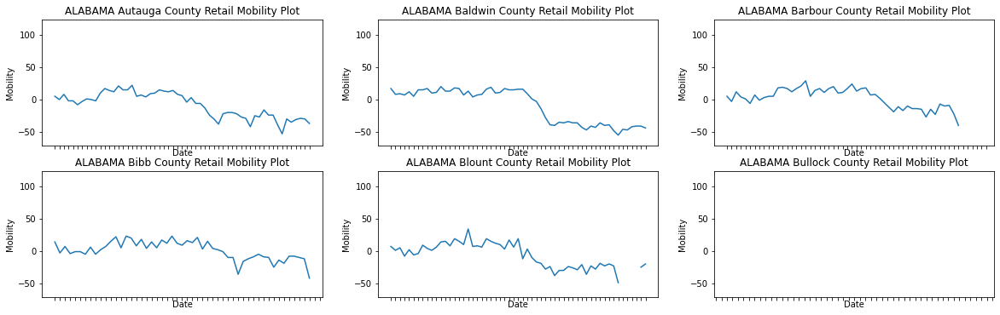

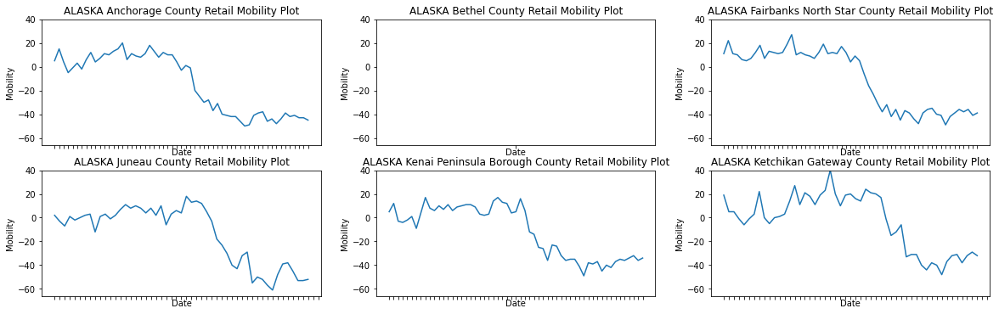

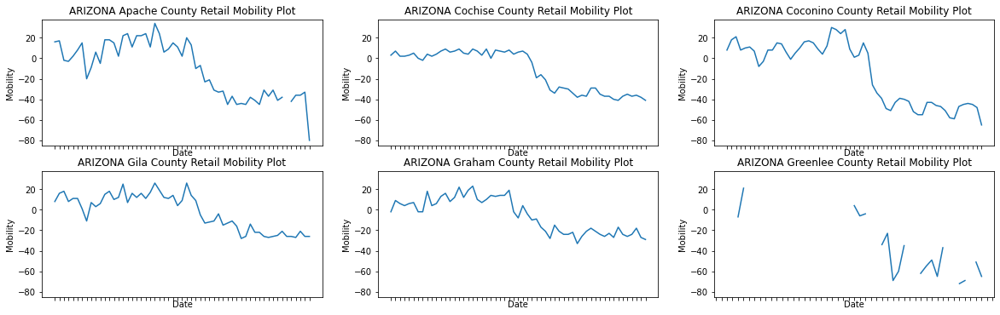

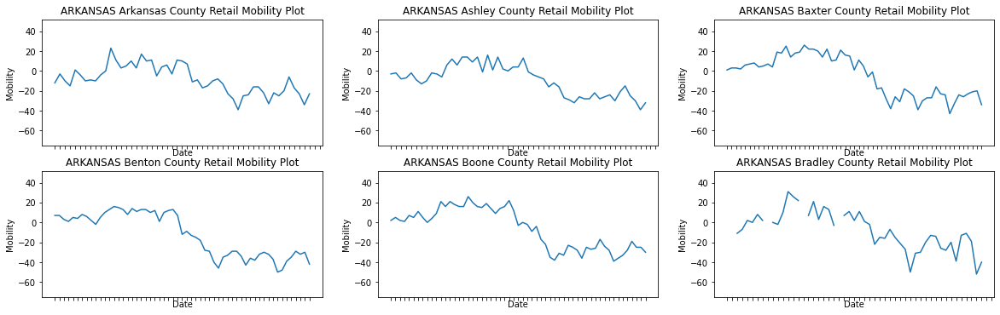

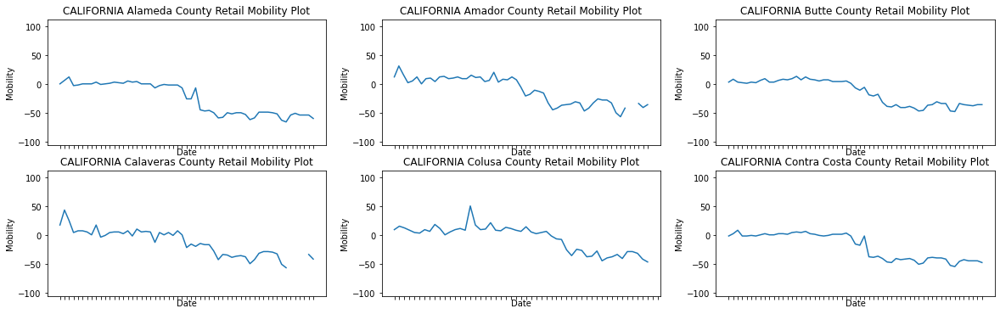

...

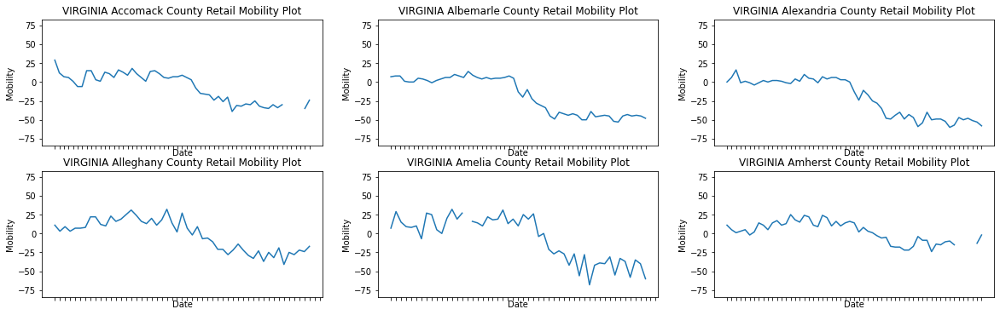

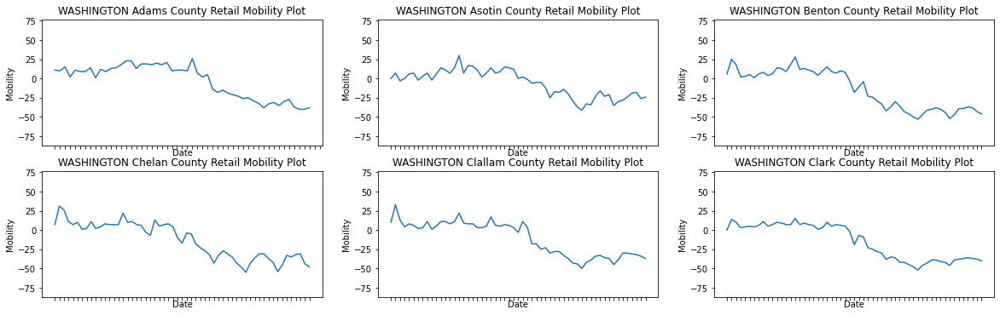

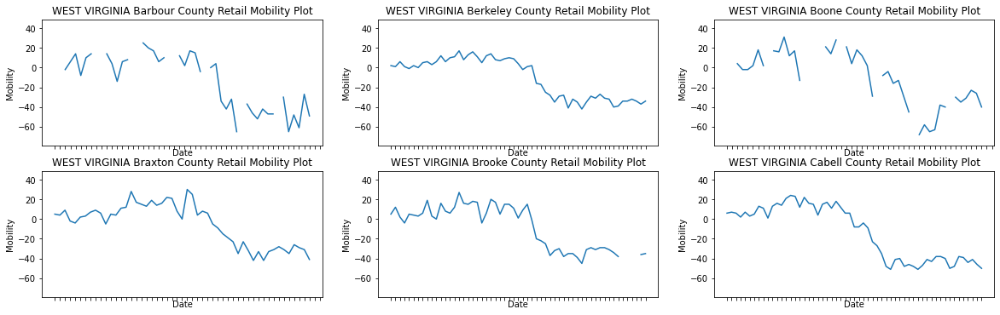

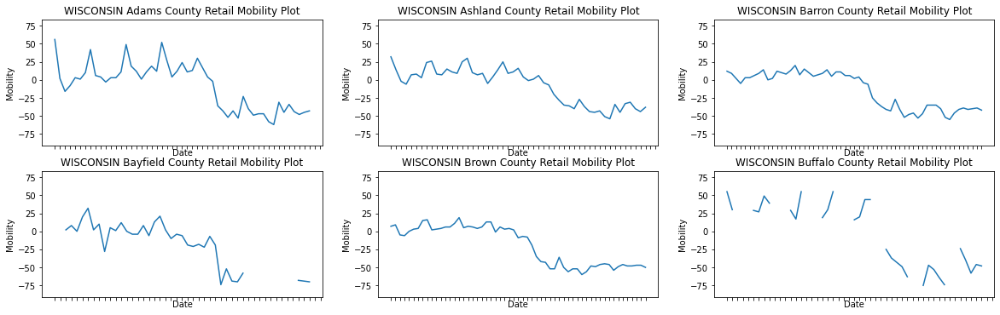

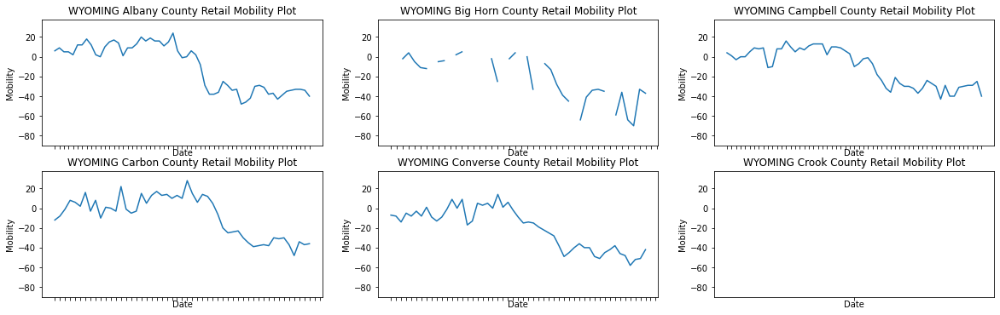

In [44]:
#Retail mobility for the first 6 counties of the 50 states
for i in range(0,50):
    plot_all(mobility,mobilitystate[i],'Retail',0)

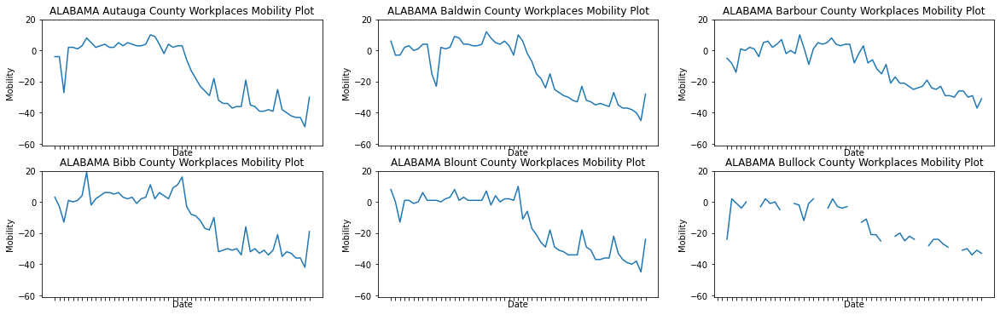

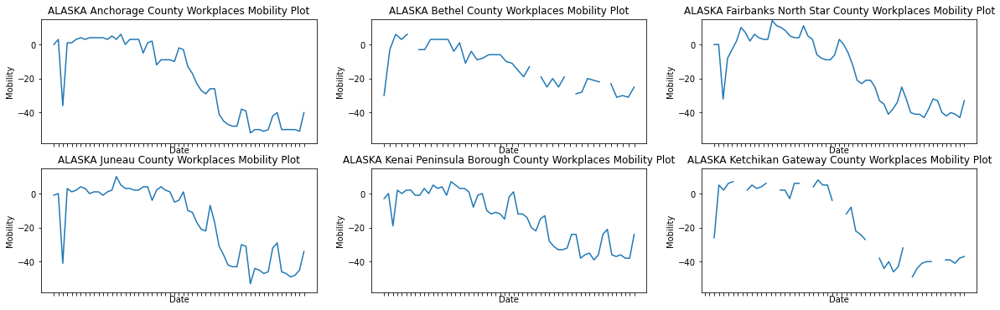

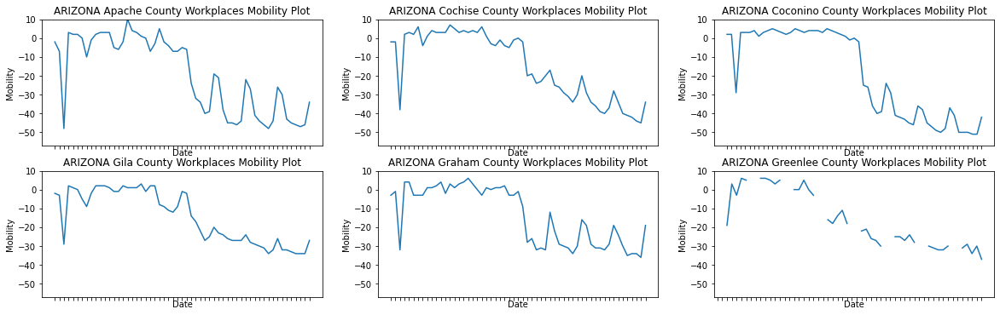

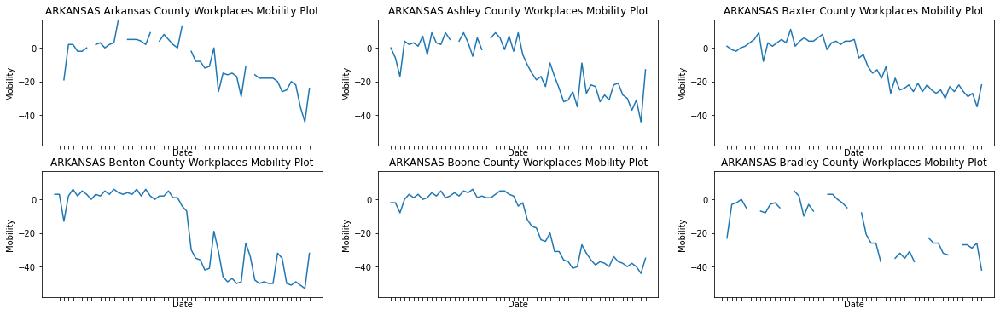

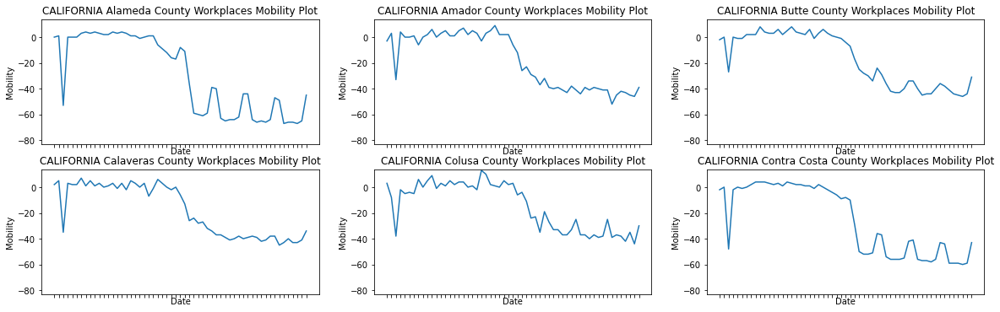

...

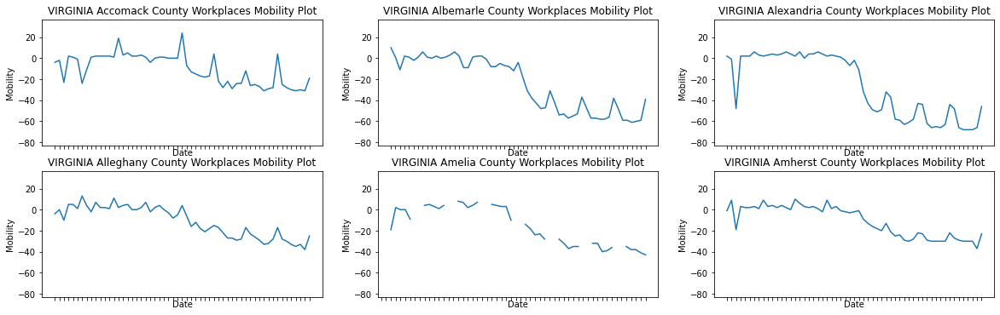

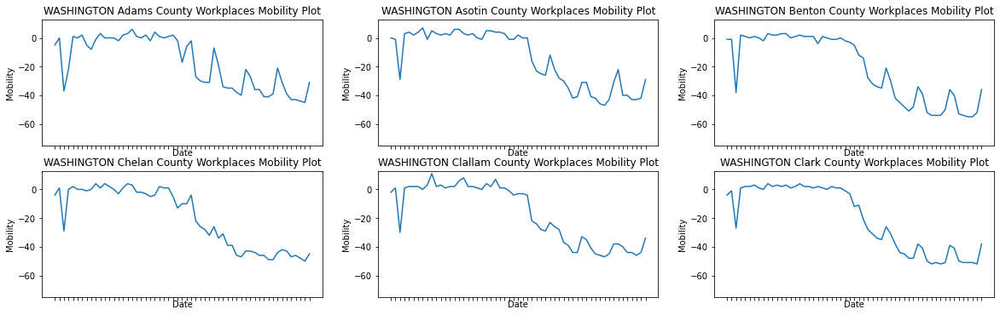

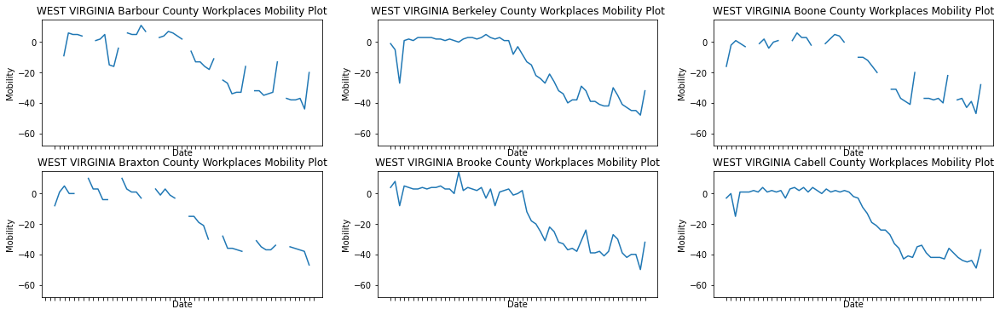

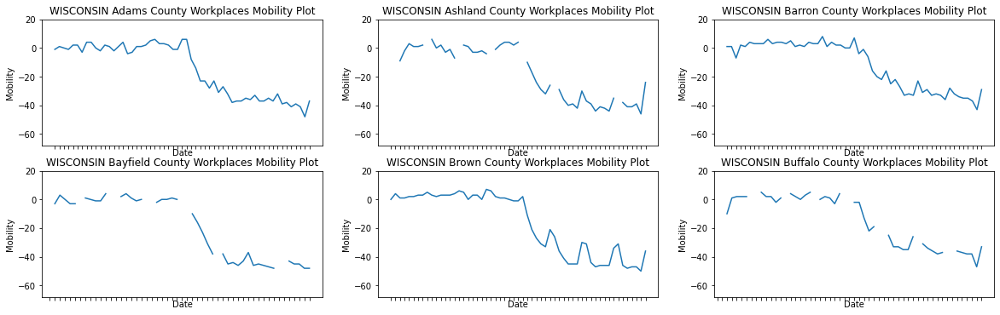

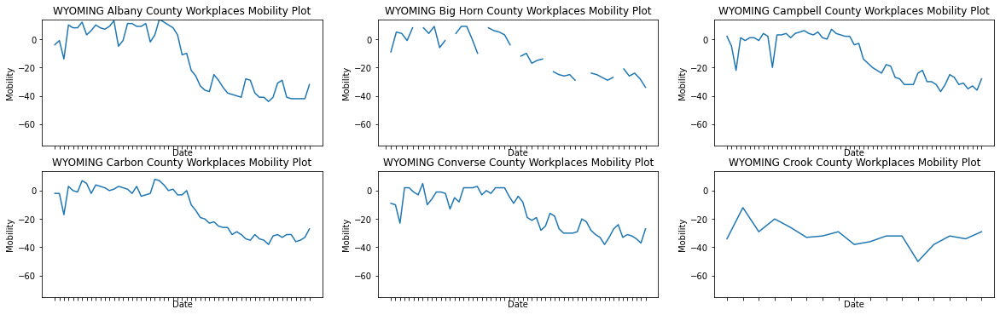

In [45]:
#workplace mobility for the first 6 counties of the 50 states
for i in range(0,50):
    plot_all(mobility,mobilitystate[i],'Workplaces',0)

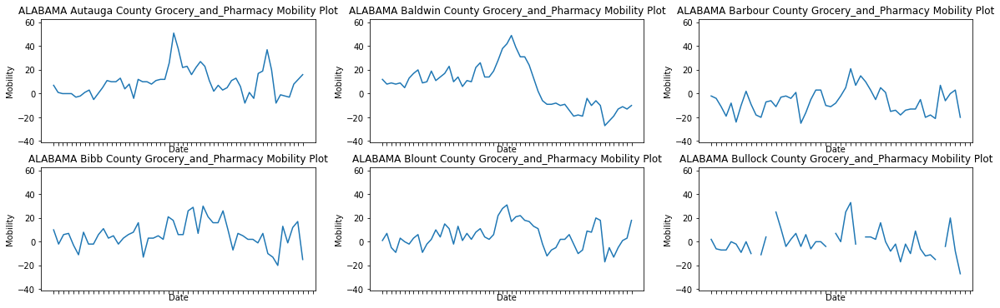

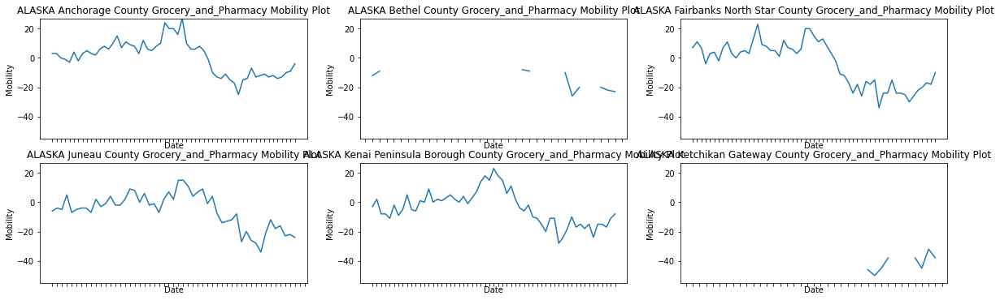

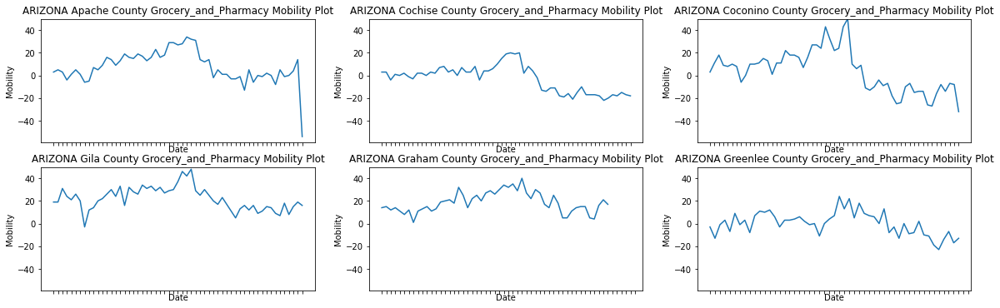

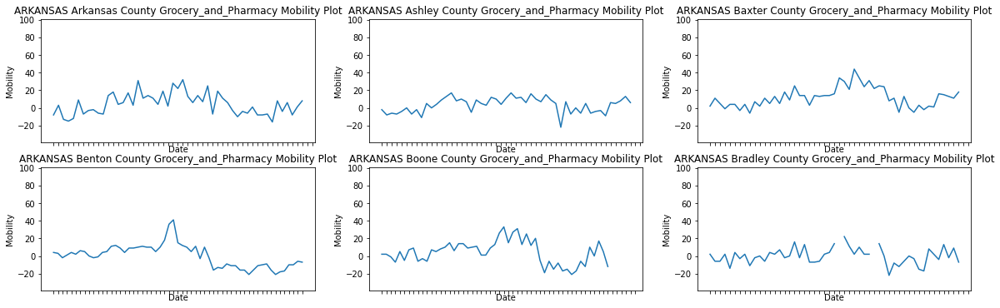

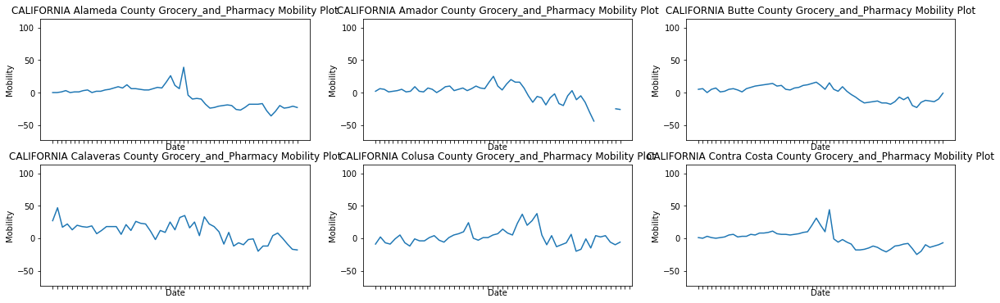

...

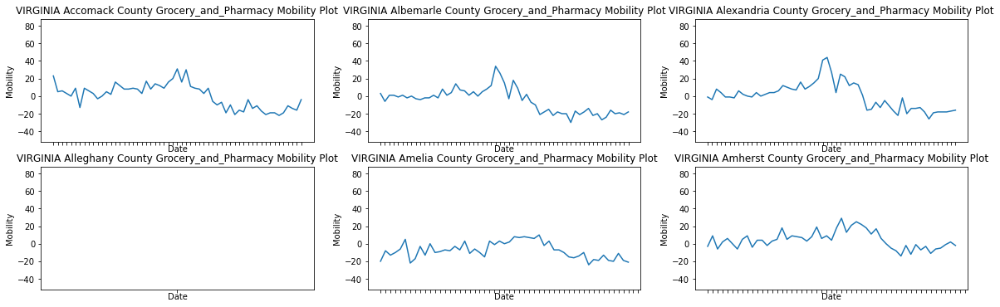

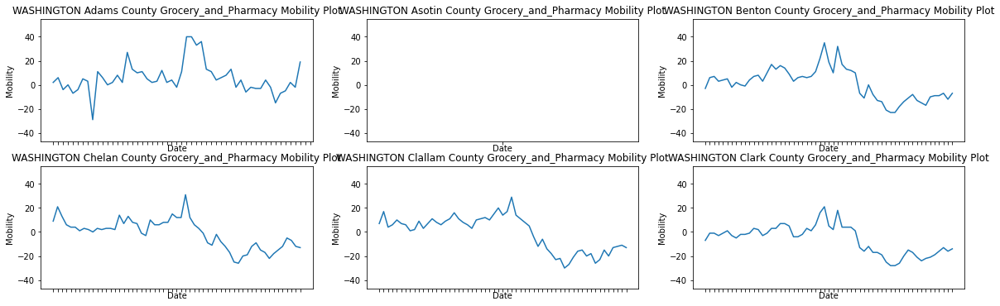

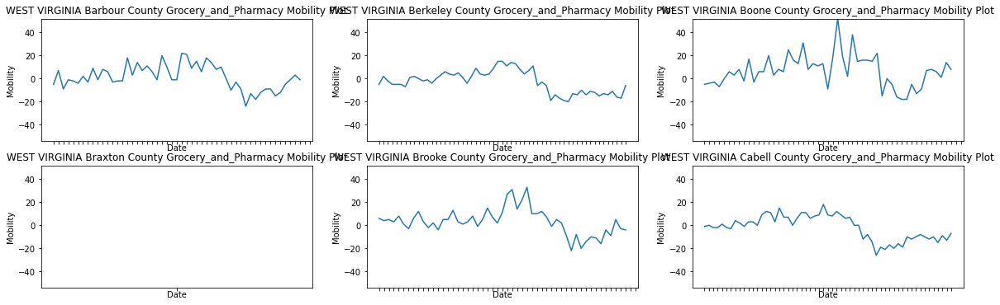

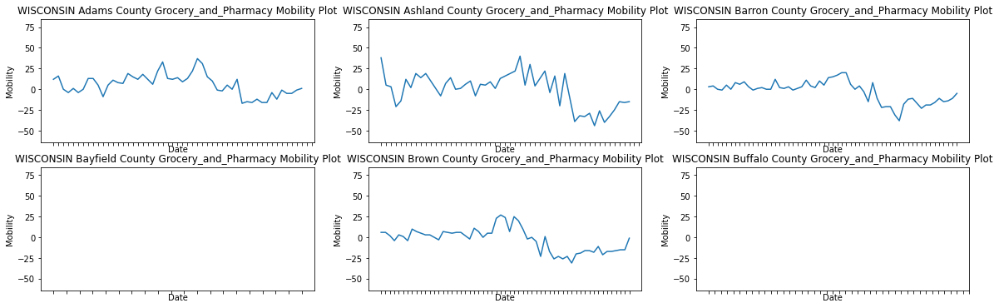

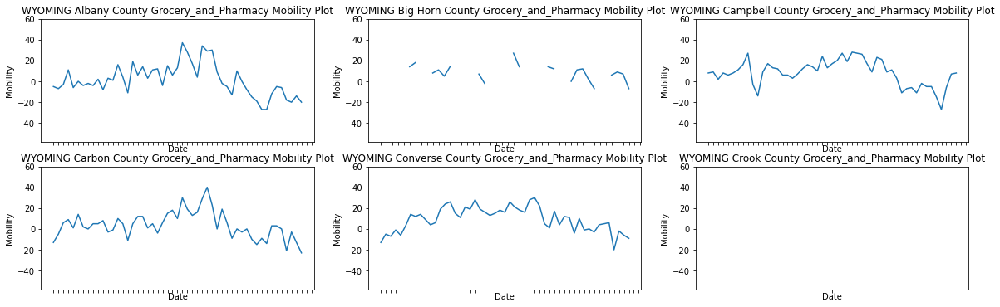

In [46]:
#grocery and pharmacy mobility for the first 6 counties of the 50 states
for i in range(0,50):
    plot_all(mobility,mobilitystate[i],'Grocery_and_Pharmacy',0)

<h4> 3c. Case study: New York State Covid Data

In [47]:
ny_covid=covid[covid['st_abbr']=='NY']['county'].unique()
ny_covid

array(['New York City Unallocated/Probable', 'Albany', 'Allegany',
       'Bronx', 'Broome', 'Cattaraugus', 'Cayuga', 'Chautauqua',
       'Chemung', 'Chenango', 'Clinton', 'Columbia', 'Cortland',
       'Delaware', 'Dutchess', 'Erie', 'Essex', 'Franklin', 'Fulton',
       'Genesee', 'Greene', 'Hamilton', 'Herkimer', 'Jefferson', 'Kings',
       'Lewis', 'Livingston', 'Madison', 'Monroe', 'Montgomery', 'Nassau',
       'New York', 'Niagara', 'Oneida', 'Onondaga', 'Ontario', 'Orange',
       'Orleans', 'Oswego', 'Otsego', 'Putnam', 'Queens', 'Rensselaer',
       'Richmond', 'Rockland', 'St. Lawrence', 'Saratoga', 'Schenectady',
       'Schoharie', 'Schuyler', 'Seneca', 'Steuben', 'Suffolk',
       'Sullivan', 'Tioga', 'Tompkins', 'Ulster', 'Warren', 'Washington',
       'Wayne', 'Westchester', 'Wyoming', 'Yates'], dtype=object)

In [48]:
ny_mob=mobility[mobility['state']=='NEW YORK']['county'].unique()
ny_mob

array(['Albany', 'Allegany', 'Bronx', 'Broome', 'Cattaraugus', 'Cayuga',
       'Chautauqua', 'Chemung', 'Chenango', 'Clinton', 'Columbia',
       'Cortland', 'Delaware', 'Dutchess', 'Erie', 'Essex', 'Franklin',
       'Fulton', 'Genesee', 'Greene', 'Herkimer', 'Jefferson', 'Kings',
       'Lewis', 'Livingston', 'Madison', 'Monroe', 'Montgomery', 'Nassau',
       'New York', 'Niagara', 'Oneida', 'Onondaga', 'Ontario', 'Orange',
       'Orleans', 'Oswego', 'Otsego', 'Putnam', 'Queens', 'Rensselaer',
       'Richmond', 'Rockland', 'Saratoga', 'Schenectady', 'Schoharie',
       'Schuyler', 'Seneca', 'St. Lawrence', 'Steuben', 'Suffolk',
       'Sullivan', 'Tioga', 'Tompkins', 'Ulster', 'Warren', 'Washington',
       'Wayne', 'Westchester', 'Wyoming', 'Yates'], dtype=object)

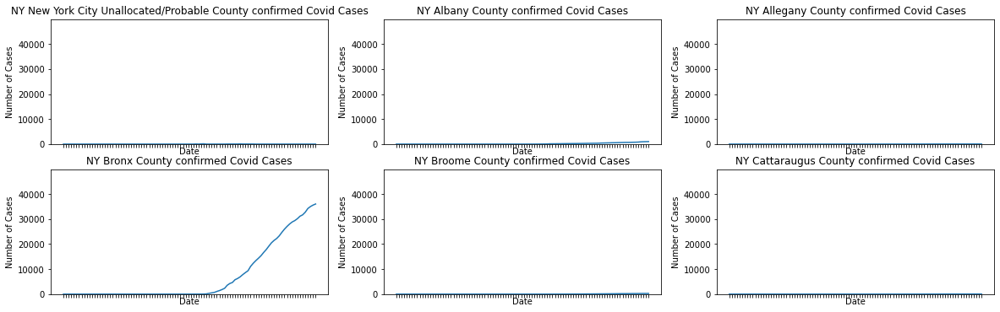

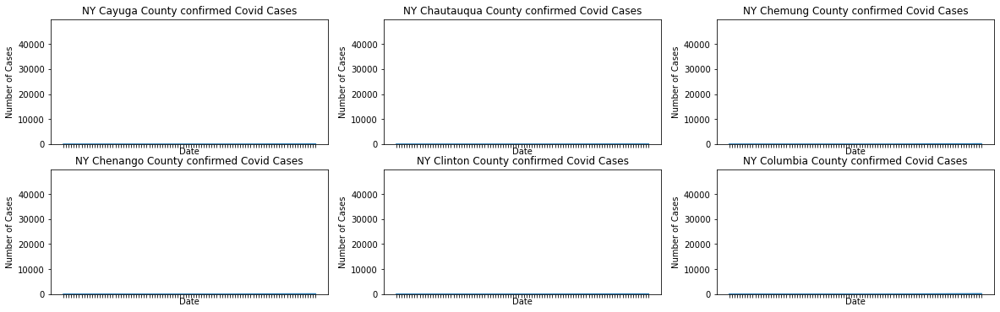

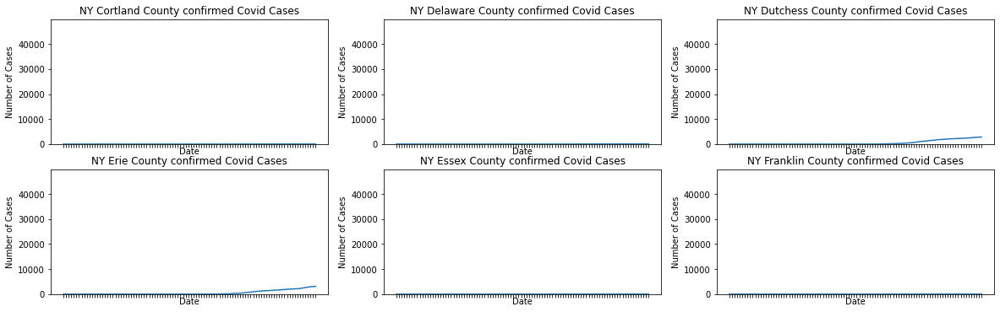

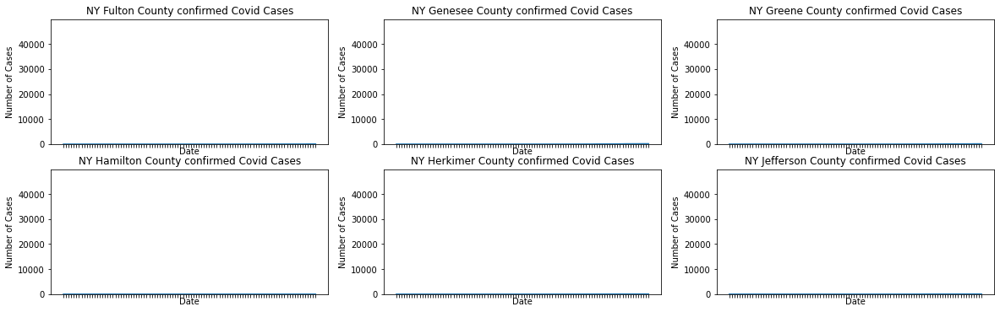

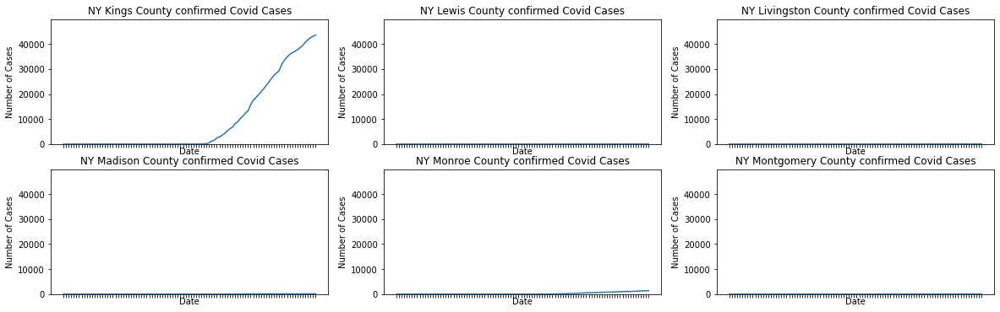

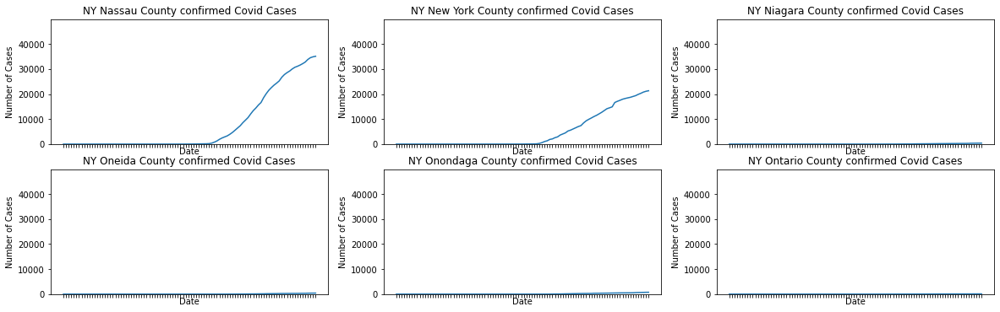

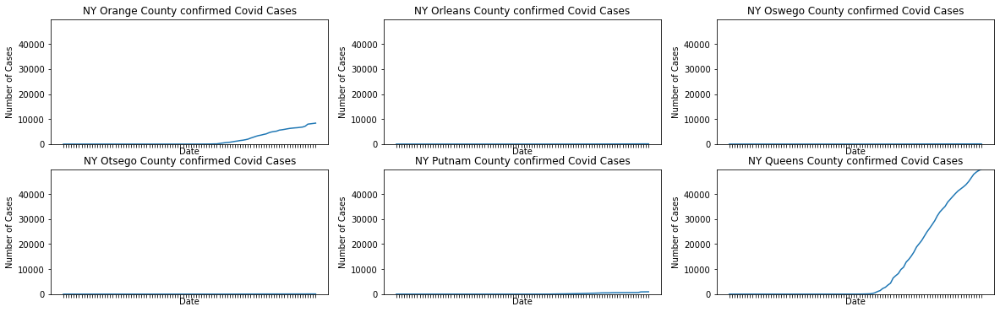

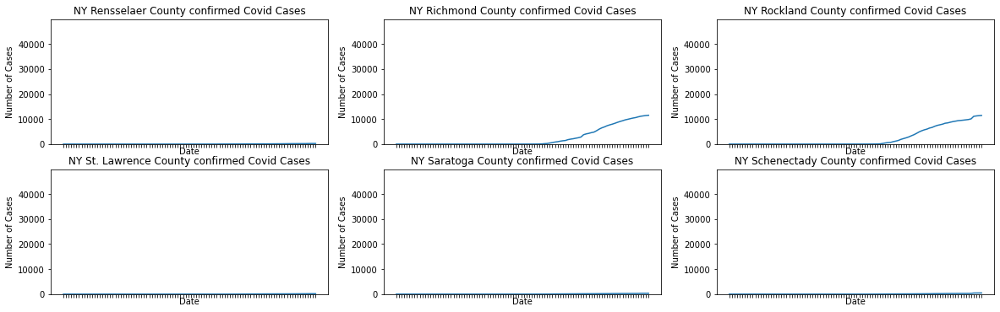

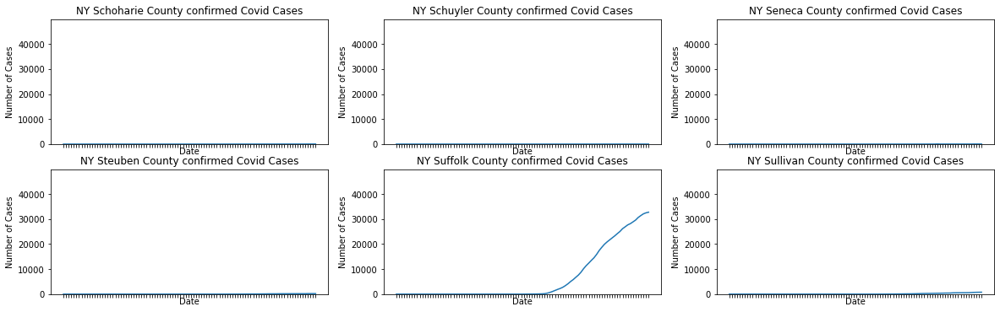

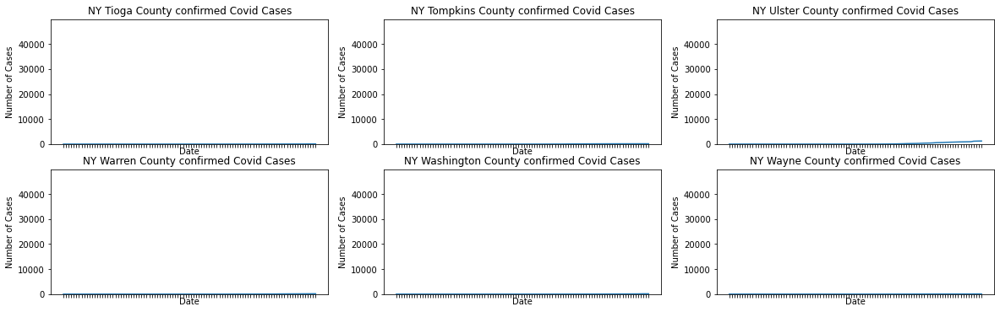

In [49]:
for i in range(0,10):
    plot_all_covid(covid,'NY','confirmed',6*i)

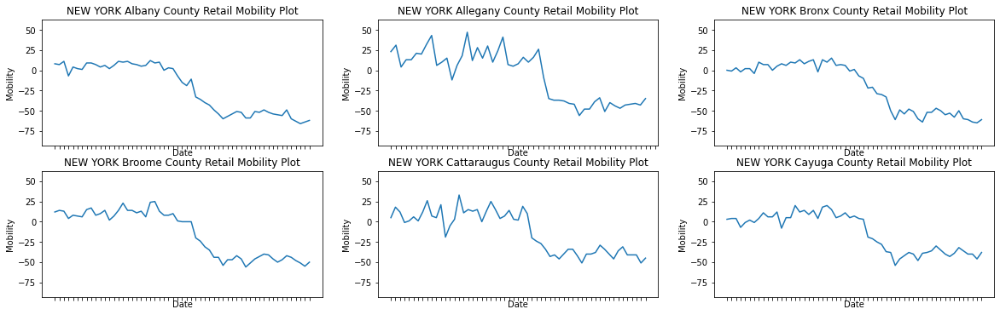

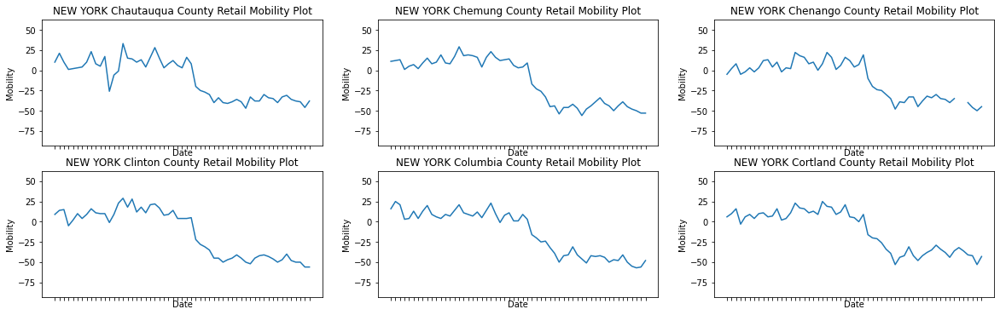

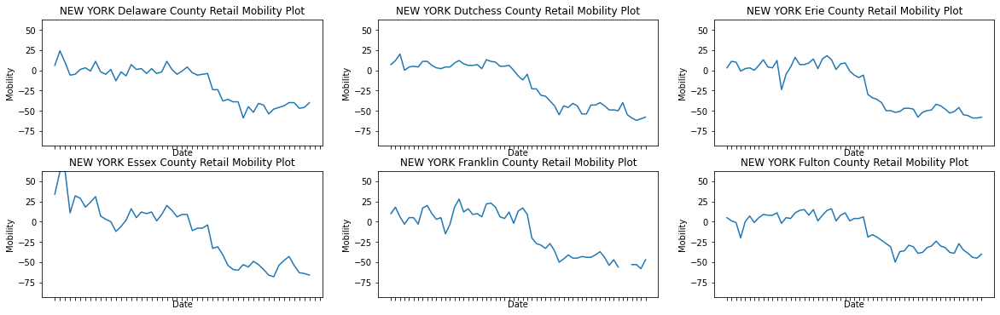

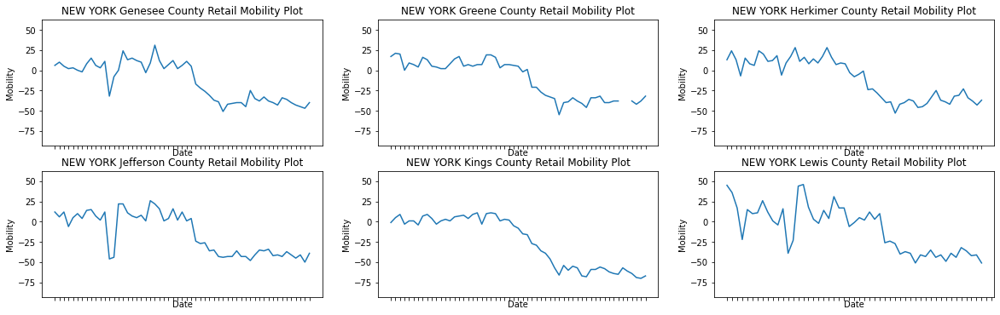

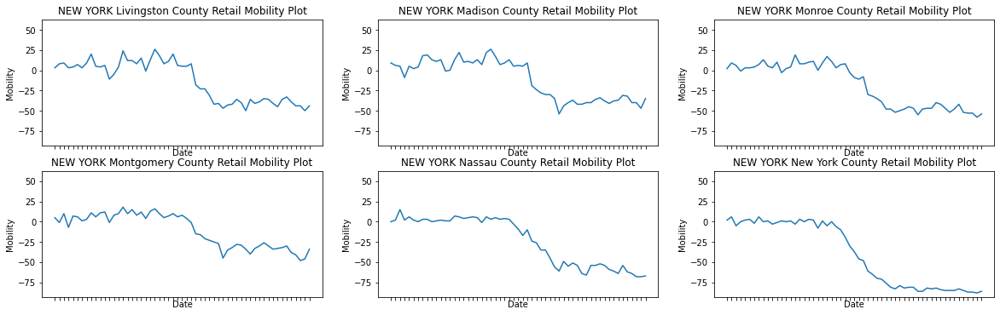

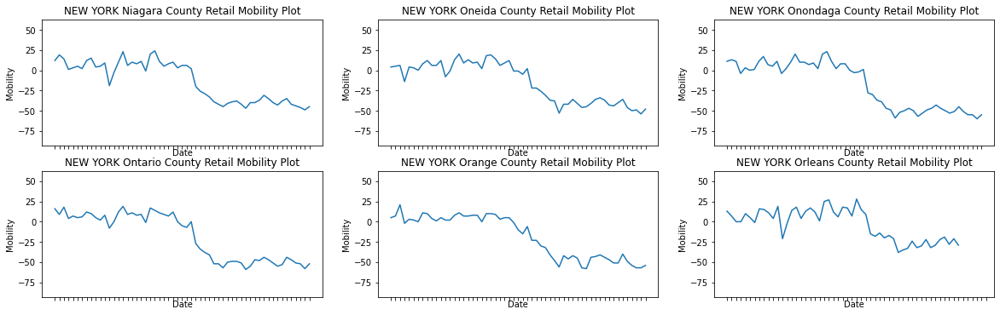

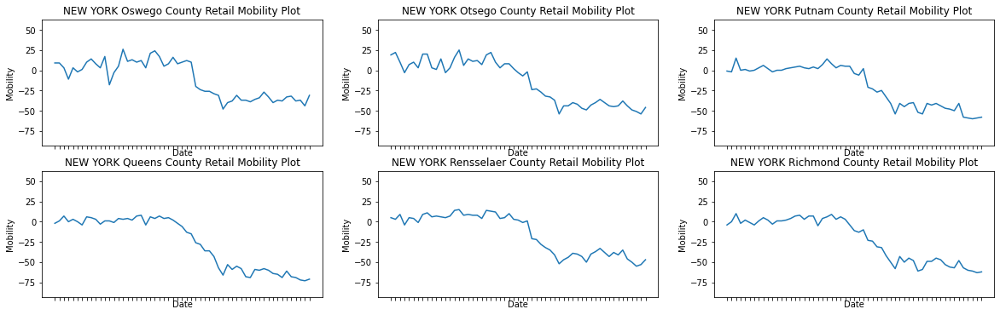

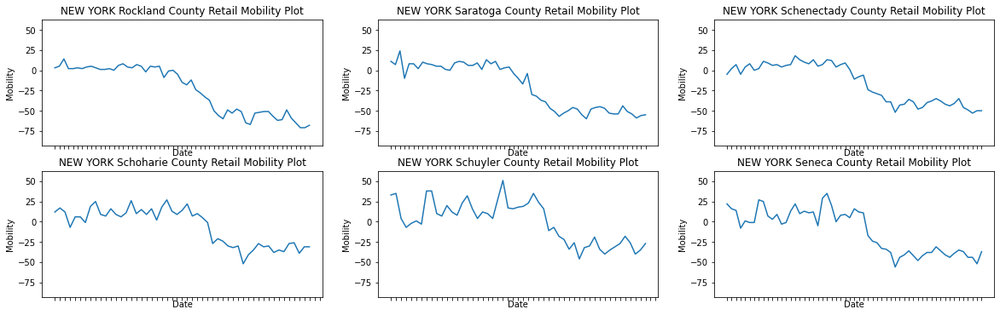

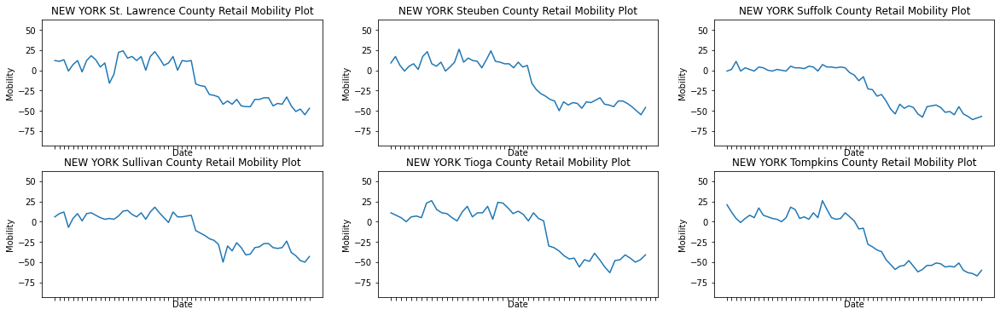

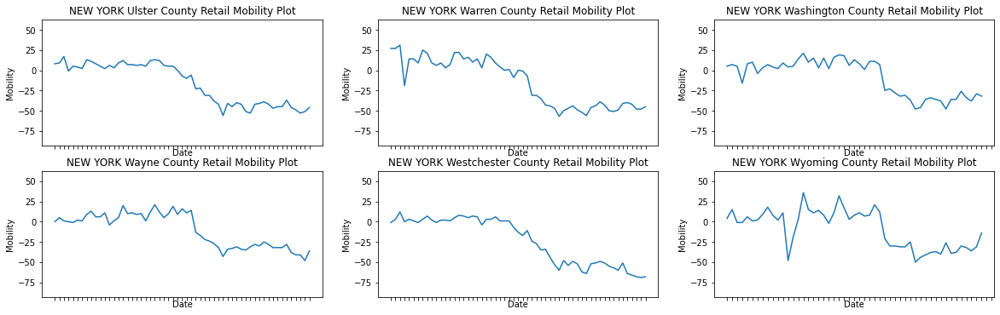

In [50]:
for i in range(0,10):
    plot_all(mobility,'NEW YORK','Retail',6*i)

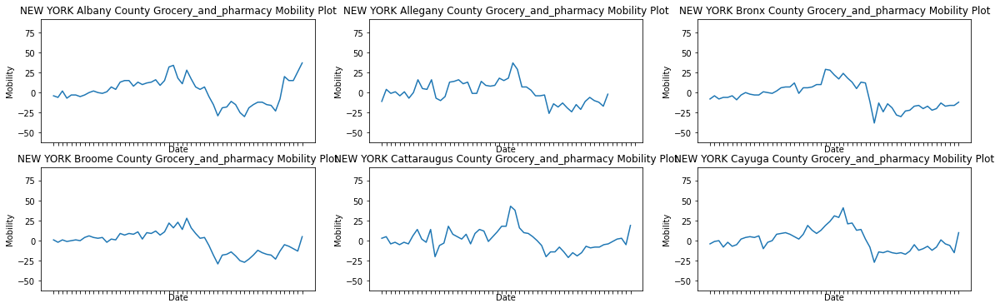

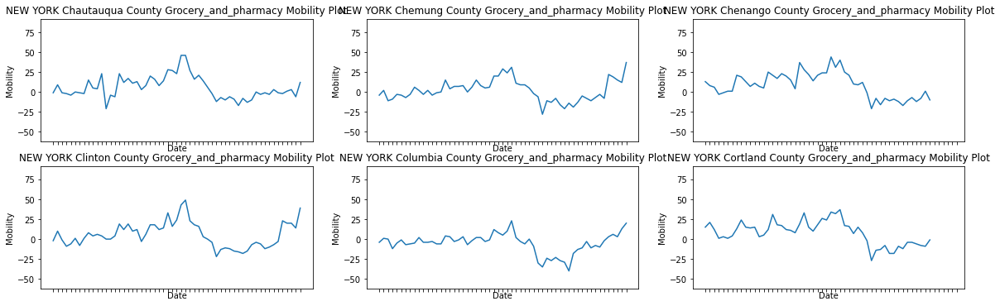

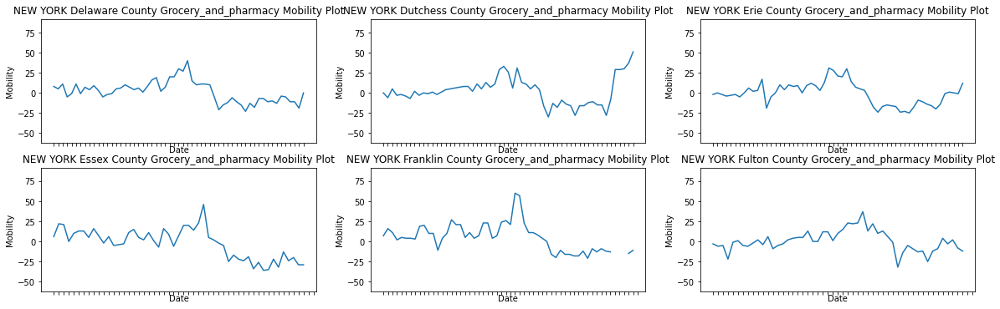

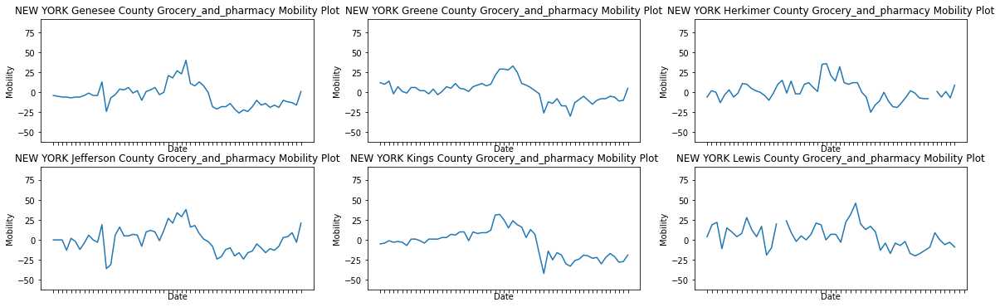

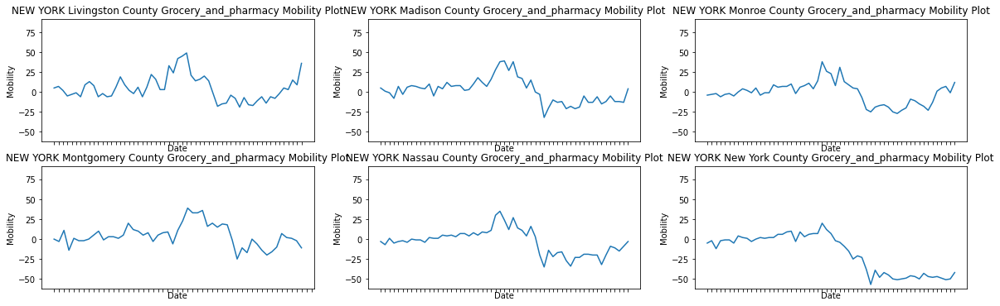

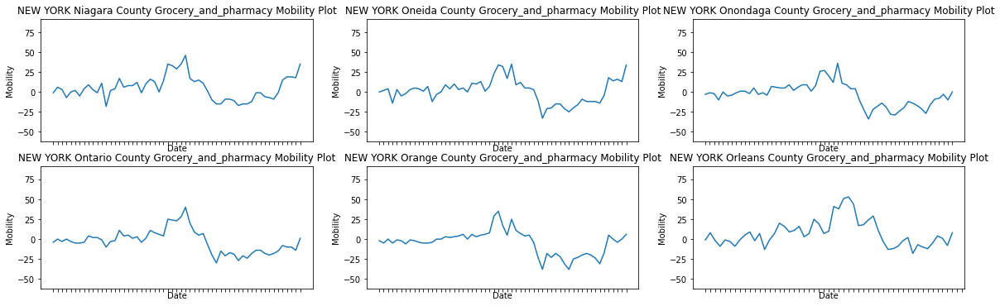

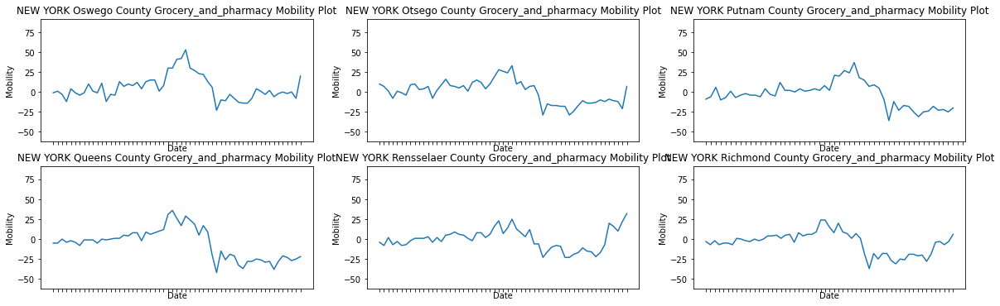

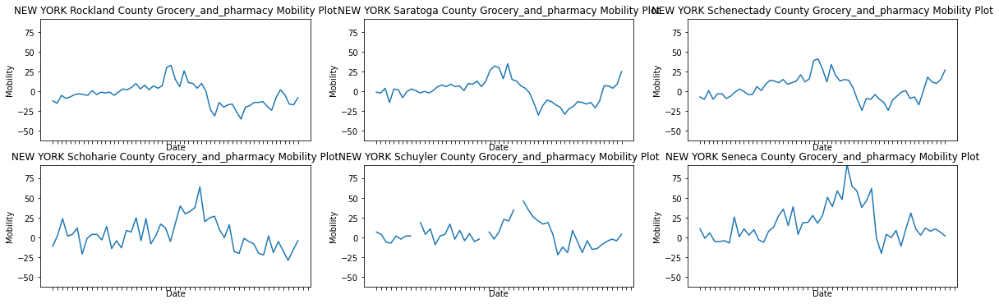

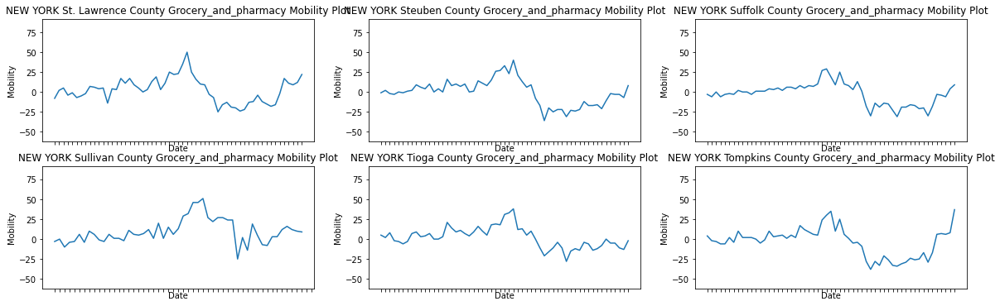

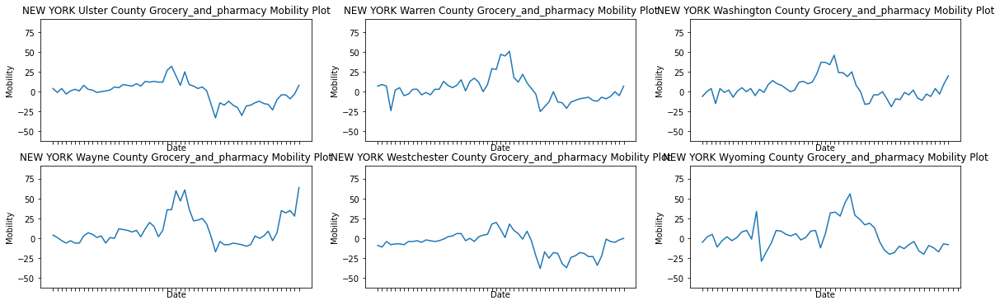

In [51]:
for i in range(0,10):
    plot_all(mobility,'NEW YORK','Grocery_and_pharmacy',6*i)

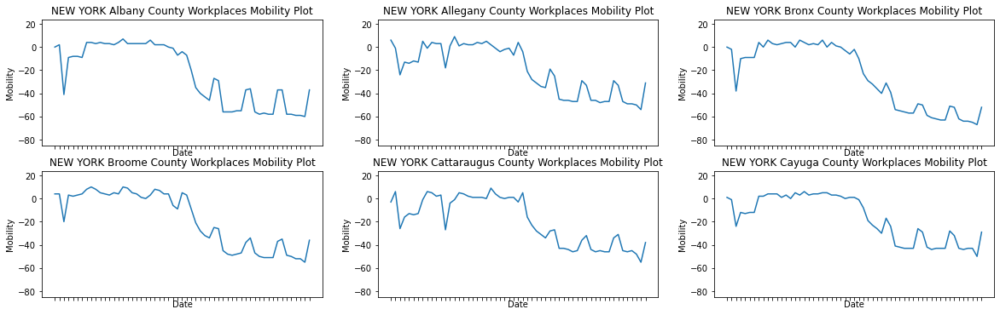

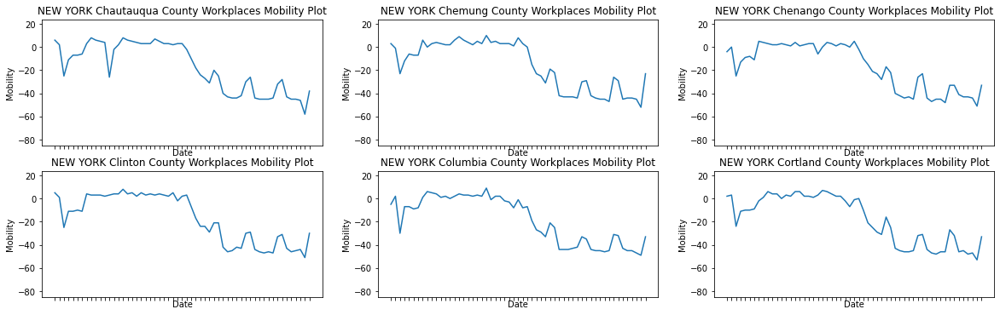

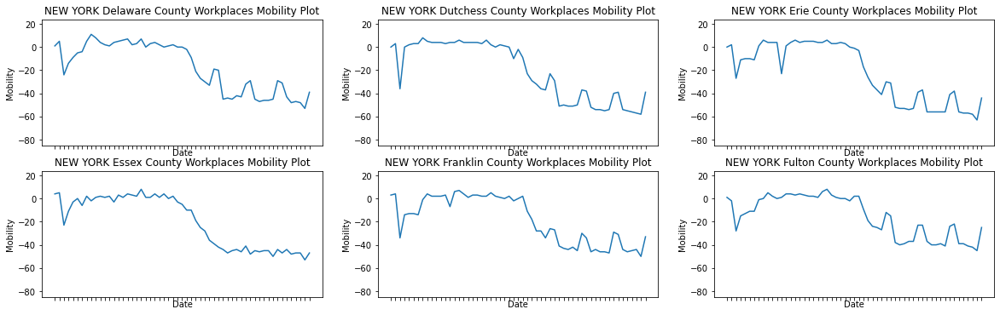

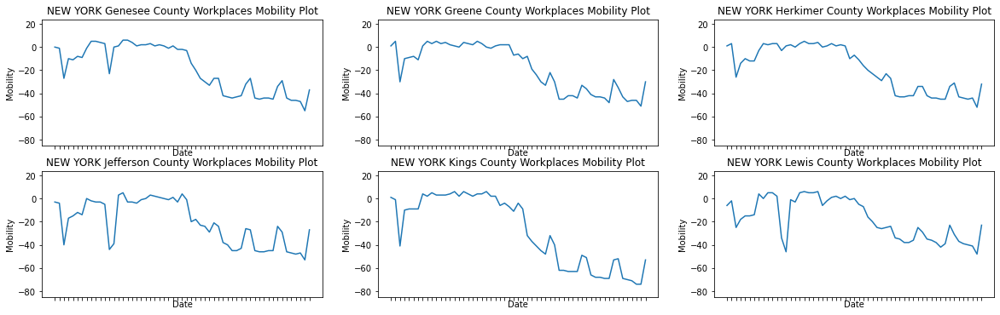

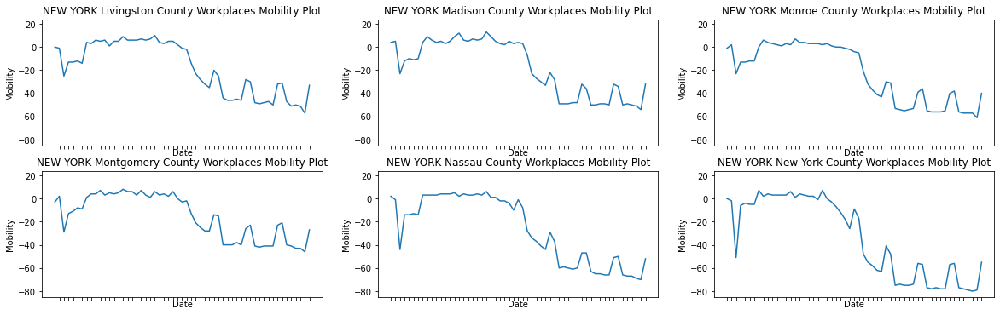

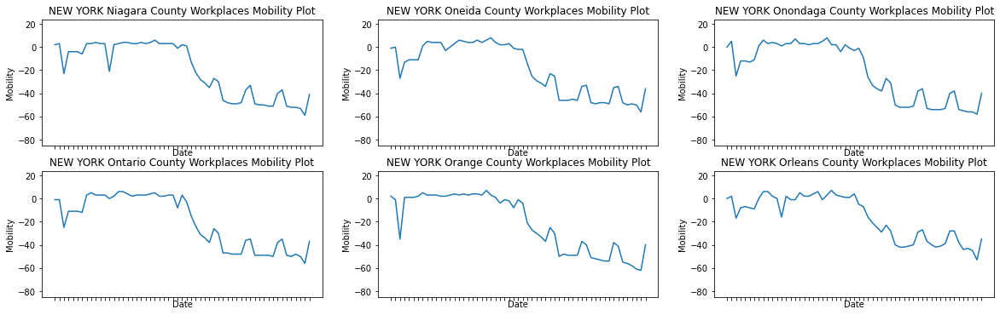

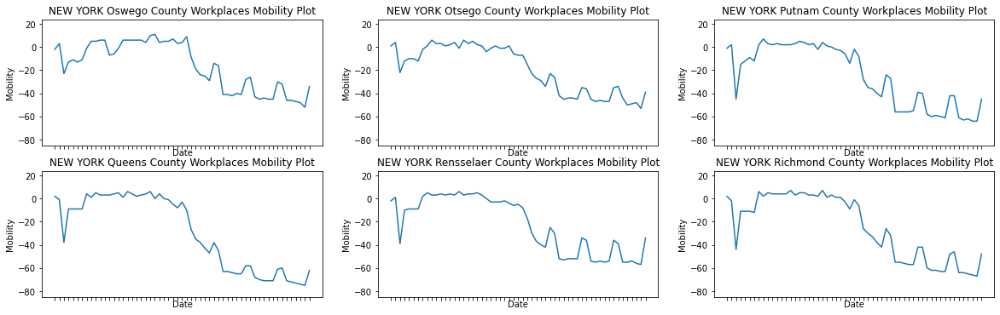

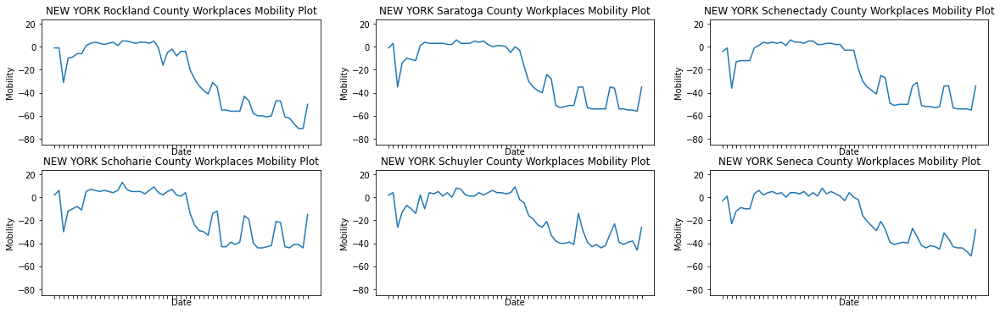

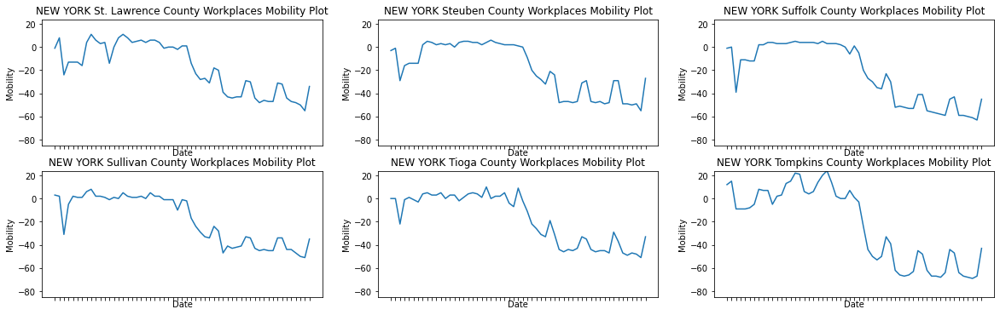

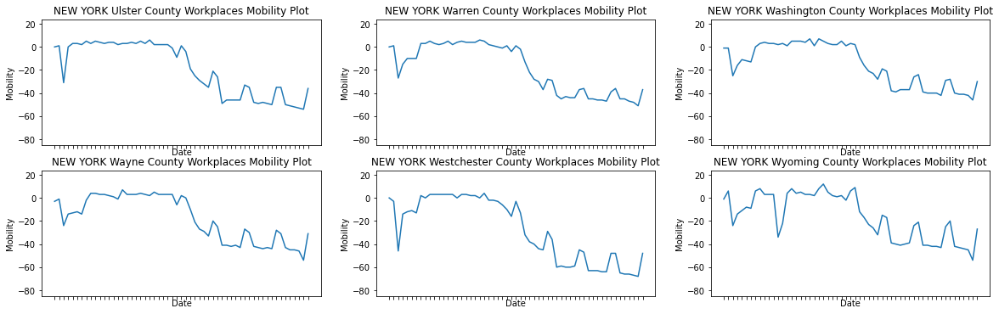

In [52]:
for i in range(0,10):
    plot_all(mobility,'NEW YORK','Workplaces',6*i)

<h3> 4. Feature Engineering

In [53]:
#Trim down the covid data to one entry per county
covid_clean=covid.drop_duplicates(subset=['st_abbr','county'],keep='last')
covid_clean.shape

(3130, 5)

In [54]:
covid_clean.head()

,st_abbr,date,confirmed,county,deaths
97,AL,2020-04-28,40,Autauga,4
195,AL,2020-04-28,171,Baldwin,3
293,AL,2020-04-28,37,Barbour,0
391,AL,2020-04-28,42,Bibb,0
489,AL,2020-04-28,34,Blount,0


In [55]:
#Fill in missing mobility data
mobility_complete1=mobility.fillna({'retail':mobility.retail.median()})
mobility_complete2=mobility_complete1.fillna({'grocery_and_pharmacy':mobility.grocery_and_pharmacy.median()})
mobility_complete=mobility_complete2.fillna({'workplaces':mobility.workplaces.median()})

In [56]:
#only keep retail, grocery and workplaces
mobility_complete=mobility_complete[['state','county','date','retail','grocery_and_pharmacy','workplaces']]
mobility_complete.head()

,state,county,date,retail,grocery_and_pharmacy,workplaces
114,ALABAMA,Autauga,2020-02-15,5.0,7.0,-4.0
115,ALABAMA,Autauga,2020-02-16,0.0,1.0,-4.0
116,ALABAMA,Autauga,2020-02-17,8.0,0.0,-27.0
117,ALABAMA,Autauga,2020-02-18,-2.0,0.0,2.0
118,ALABAMA,Autauga,2020-02-19,-2.0,0.0,2.0


In [57]:
#calculate minimum value
mobility_complete['retail_min']=mobility_complete.groupby(['state','county'])['retail'].transform(np.min)
mobility_complete['grocery_min']=mobility_complete.groupby(['state','county'])['grocery_and_pharmacy'].transform(np.min)
mobility_complete['workplaces_min']=mobility_complete.groupby(['state','county'])['workplaces'].transform(np.min)
mobility_complete.head()

,state,county,date,retail,grocery_and_pharmacy,workplaces,retail_min,grocery_min,workplaces_min
114,ALABAMA,Autauga,2020-02-15,5.0,7.0,-4.0,-53.0,-8.0,-49.0
115,ALABAMA,Autauga,2020-02-16,0.0,1.0,-4.0,-53.0,-8.0,-49.0
116,ALABAMA,Autauga,2020-02-17,8.0,0.0,-27.0,-53.0,-8.0,-49.0
117,ALABAMA,Autauga,2020-02-18,-2.0,0.0,2.0,-53.0,-8.0,-49.0
118,ALABAMA,Autauga,2020-02-19,-2.0,0.0,2.0,-53.0,-8.0,-49.0


In [58]:
#calculate maximum value
mobility_complete['retail_max']=mobility_complete.groupby(['state','county'])['retail'].transform(np.max)
mobility_complete['grocery_max']=mobility_complete.groupby(['state','county'])['grocery_and_pharmacy'].transform(np.max)
mobility_complete['workplaces_max']=mobility_complete.groupby(['state','county'])['workplaces'].transform(np.max)
mobility_complete.head()

,state,county,date,retail,grocery_and_pharmacy,workplaces,retail_min,grocery_min,workplaces_min,retail_max,grocery_max,workplaces_max
114,ALABAMA,Autauga,2020-02-15,5.0,7.0,-4.0,-53.0,-8.0,-49.0,22.0,51.0,10.0
115,ALABAMA,Autauga,2020-02-16,0.0,1.0,-4.0,-53.0,-8.0,-49.0,22.0,51.0,10.0
116,ALABAMA,Autauga,2020-02-17,8.0,0.0,-27.0,-53.0,-8.0,-49.0,22.0,51.0,10.0
117,ALABAMA,Autauga,2020-02-18,-2.0,0.0,2.0,-53.0,-8.0,-49.0,22.0,51.0,10.0
118,ALABAMA,Autauga,2020-02-19,-2.0,0.0,2.0,-53.0,-8.0,-49.0,22.0,51.0,10.0


In [59]:
#only keep for one entry per county
mobility_day=mobility_complete.drop_duplicates(subset=['state','county'],keep='first')
mobility_single=mobility_day.drop(['date','retail','grocery_and_pharmacy','workplaces'],axis=1)
mobility_single.head()

,state,county,retail_min,grocery_min,workplaces_min,retail_max,grocery_max,workplaces_max
114,ALABAMA,Autauga,-53.0,-8.0,-49.0,22.0,51.0,10.0
171,ALABAMA,Baldwin,-55.0,-27.0,-45.0,20.0,49.0,12.0
228,ALABAMA,Barbour,-40.0,-25.0,-37.0,29.0,21.0,10.0
285,ALABAMA,Bibb,-42.0,-20.0,-42.0,23.0,30.0,19.0
342,ALABAMA,Blount,-49.0,-17.0,-45.0,34.0,31.0,10.0


In [60]:
mobility_single.shape

(2818, 8)

In [61]:
# Merge the covid data with social dataset
covidsocial=covid_clean.merge(social,on=['st_abbr','county'],how='inner')

In [62]:
covidsocial.shape

(3011, 10)

In [63]:
covidsocial.head()

,st_abbr,date,confirmed,county,deaths,state,ep_pov,ep_unemp,ep_age65,ep_minrty
0,AL,2020-04-28,40,Autauga,4,ALABAMA,12.3,5.6,14.0,24.3
1,AL,2020-04-28,171,Baldwin,3,ALABAMA,13.0,6.3,18.7,16.8
2,AL,2020-04-28,37,Barbour,0,ALABAMA,26.4,12.8,16.5,54.1
3,AL,2020-04-28,42,Bibb,0,ALABAMA,16.5,7.1,14.9,25.2
4,AL,2020-04-28,34,Blount,0,ALABAMA,16.5,6.0,17.2,12.3


In [64]:
# Further merge with the mobility data
covidsocialmobility=covidsocial.merge(mobility_single,on=['state','county'],how='inner')

In [65]:
covidsocialmobility.shape

(2706, 16)

In [66]:
covidsocialmobility.head()

,st_abbr,date,confirmed,county,deaths,state,ep_pov,ep_unemp,ep_age65,ep_minrty,retail_min,grocery_min,workplaces_min,retail_max,grocery_max,workplaces_max
0,AL,2020-04-28,40,Autauga,4,ALABAMA,12.3,5.6,14.0,24.3,-53.0,-8.0,-49.0,22.0,51.0,10.0
1,AL,2020-04-28,171,Baldwin,3,ALABAMA,13.0,6.3,18.7,16.8,-55.0,-27.0,-45.0,20.0,49.0,12.0
2,AL,2020-04-28,37,Barbour,0,ALABAMA,26.4,12.8,16.5,54.1,-40.0,-25.0,-37.0,29.0,21.0,10.0
3,AL,2020-04-28,42,Bibb,0,ALABAMA,16.5,7.1,14.9,25.2,-42.0,-20.0,-42.0,23.0,30.0,19.0
4,AL,2020-04-28,34,Blount,0,ALABAMA,16.5,6.0,17.2,12.3,-49.0,-17.0,-45.0,34.0,31.0,10.0


In [67]:
#Final merge with the health data
csmh=pd.merge(covidsocialmobility,health,on=['state','county'],how='inner')

In [68]:
csmh.shape

(2706, 31)

In [69]:
csmh.st_abbr.value_counts()

TX    219
GA    149
KY    111
MO    106
NC     98
IA     97
IL     97
TN     93
VA     93
IN     92
OH     88
MN     84
MI     82
MS     78
AR     71
WI     71
OK     68
FL     67
AL     67
KS     66
PA     65
NY     61
NE     57
CA     56
CO     53
WV     50
SC     46
ID     38
WA     36
MT     34
SD     34
OR     34
NM     28
UT     25
ND     23
MD     23
WY     22
NJ     21
ME     16
AZ     15
NV     14
VT     14
MA     14
NH     10
CT      8
RI      5
HI      4
DE      3
Name: st_abbr, dtype: int64

In [70]:
len(csmh.state.value_counts())

48

In [71]:
csmh.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2706 entries, 0 to 2705
Data columns (total 31 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   st_abbr                                          2706 non-null   object 
 1   date                                             2706 non-null   object 
 2   confirmed                                        2706 non-null   int64  
 3   county                                           2706 non-null   object 
 4   deaths                                           2706 non-null   int64  
 5   state                                            2706 non-null   object 
 6   ep_pov                                           2706 non-null   float64
 7   ep_unemp                                         2706 non-null   float64
 8   ep_age65                                         2706 non-null   float64
 9   ep_minrty                     

In [72]:
#Calculate the case death rate
csmh['casedeathrate']=csmh['deaths']/csmh['confirmed']*100

In [73]:
summary=csmh.describe()
summary.transpose()

,count,mean,std,min,25%,50%,75%,max
confirmed,2706.0,355.213969,2265.514951,0.000000,5.000000,20.000000,86.000000,49929.000000
deaths,2706.0,19.664819,179.713213,0.000000,0.000000,0.000000,3.000000,5281.000000
ep_pov,2706.0,16.373392,6.175672,3.700000,12.000000,15.700000,19.800000,47.100000
ep_unemp,2706.0,7.219401,2.944415,0.000000,5.300000,6.900000,8.800000,26.100000
ep_age65,2706.0,17.312010,4.147375,3.900000,14.700000,17.100000,19.500000,53.100000
ep_minrty,2706.0,22.536807,19.457418,0.400000,6.900000,15.400000,33.700000,99.200000
retail_min,2706.0,-46.401700,18.196650,-100.000000,-58.000000,-49.000000,-39.000000,-2.000000
grocery_min,2706.0,-20.402809,13.065043,-74.000000,-29.000000,-21.000000,-12.000000,2.000000
workplaces_min,2706.0,-47.380266,9.386105,-80.000000,-53.000000,-48.000000,-42.000000,-11.000000
retail_max,2706.0,23.368441,16.793050,-45.000000,16.000000,23.000000,30.000000,226.000000


Text(0.5, 1.0, 'Covid-19 Case Death Rate on 2020-04-28 in US Counties')

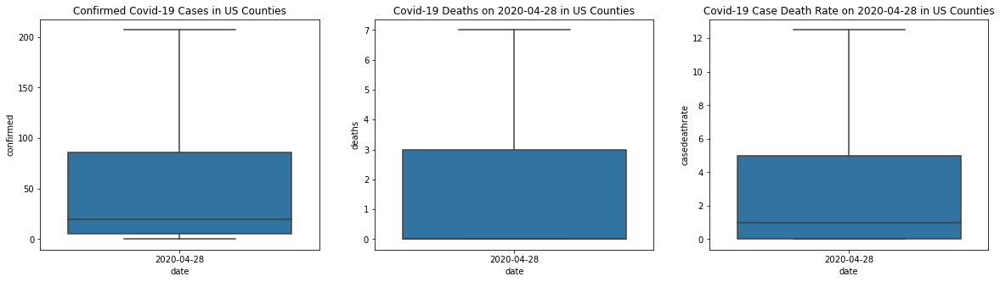

In [74]:
#Plot case, death and death rate
f,axs=plt.subplots(1,3,figsize=(20,5))
plt.subplot(1,3,1)
sns.boxplot(x="date",y="confirmed",data=csmh,showfliers=False)
#csmh['confirmed'].plot.hist(bins=50)
plt.title("Confirmed Covid-19 Cases in US Counties")
plt.subplot(1,3,2)
sns.boxplot(x="date",y="deaths",data=csmh,showfliers=False)
#csmh['deaths'].plot.hist(bins=50)
plt.title("Covid-19 Deaths on 2020-04-28 in US Counties")
plt.subplot(1,3,3)
sns.boxplot(x="date",y="casedeathrate",data=csmh,showfliers=False)
#csmh['casedeathrate'].plot.hist(bins=50)
plt.title("Covid-19 Case Death Rate on 2020-04-28 in US Counties")

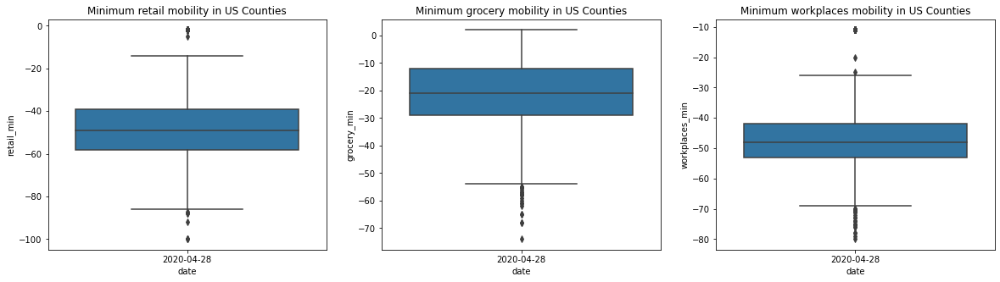

In [100]:
#Plot mobility data
f,axs=plt.subplots(1,3,figsize=(20,5))
plt.subplot(1,3,1)
sns.boxplot(x="date",y="retail_min",data=csmh,showfliers=True)
plt.title("Minimum retail mobility in US Counties")

plt.subplot(1,3,2)
sns.boxplot(x="date",y="grocery_min",data=csmh,showfliers=True)
plt.title("Minimum grocery mobility in US Counties")

plt.subplot(1,3,3)
sns.boxplot(x="date",y="workplaces_min",data=csmh,showfliers=True)
plt.title("Minimum workplaces mobility in US Counties")

plt.savefig('min_mobility_us.png')

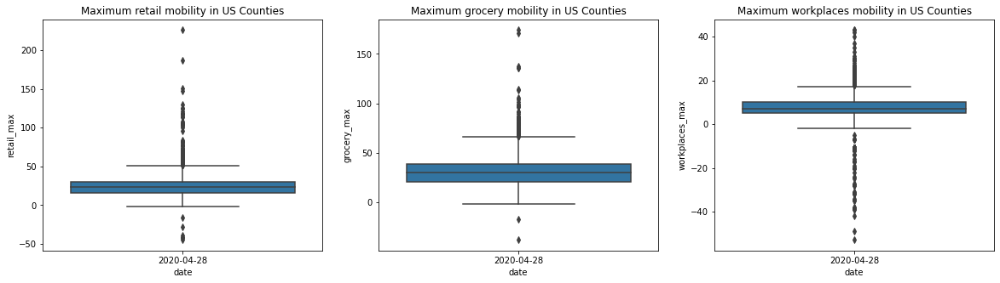

In [101]:
#Plot mobility data
f,axs=plt.subplots(1,3,figsize=(20,5))
plt.subplot(1,3,1)
sns.boxplot(x="date",y="retail_max",data=csmh,showfliers=True)
plt.title("Maximum retail mobility in US Counties")

plt.subplot(1,3,2)
sns.boxplot(x="date",y="grocery_max",data=csmh,showfliers=True)
plt.title("Maximum grocery mobility in US Counties")

plt.subplot(1,3,3)
sns.boxplot(x="date",y="workplaces_max",data=csmh,showfliers=True)
plt.title("Maximum workplaces mobility in US Counties")

plt.savefig('maximum_mobility_us.png')

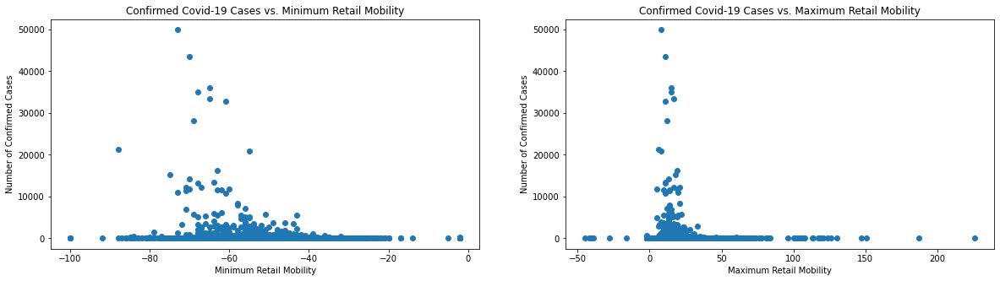

In [97]:
#Plot retail mobility vs. confirmed cases
f,axs=plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.scatter(csmh['retail_min'],csmh['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Minimum Retail Mobility")
plt.xlabel('Minimum Retail Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.subplot(1,2,2)
plt.scatter(csmh['retail_max'],csmh['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Maximum Retail Mobility")
plt.xlabel('Maximum Retail Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.savefig('retail_case_us.png')

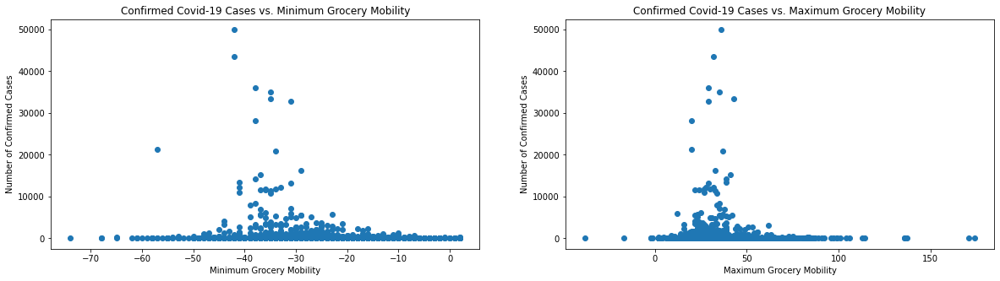

In [98]:
#Plot grocery mobility vs. confirmed cases
f,axs=plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.scatter(csmh['grocery_min'],csmh['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Minimum Grocery Mobility")
plt.xlabel('Minimum Grocery Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.subplot(1,2,2)
plt.scatter(csmh['grocery_max'],csmh['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Maximum Grocery Mobility")
plt.xlabel('Maximum Grocery Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.savefig('grocery_case_us.png')

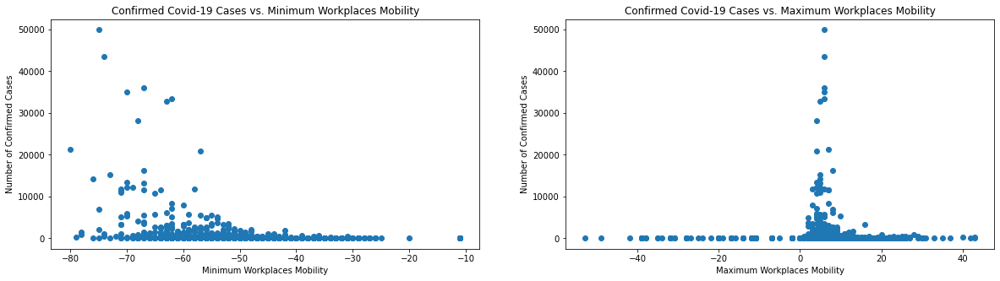

In [99]:
#Plot workplaces mobility vs. confirmed cases
f,axs=plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.scatter(csmh['workplaces_min'],csmh['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Minimum Workplaces Mobility")
plt.xlabel('Minimum Workplaces Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.subplot(1,2,2)
plt.scatter(csmh['workplaces_max'],csmh['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Maximum Workplaces Mobility")
plt.xlabel('Maximum Workplaces Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.savefig('workplaces_case_us.png')

In [80]:
#New york state analysis
ny=csmh[csmh['st_abbr']=='NY']

In [81]:
ny.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61 entries, 1561 to 1621
Data columns (total 32 columns):
 #   Column                                           Non-Null Count  Dtype  
---  ------                                           --------------  -----  
 0   st_abbr                                          61 non-null     object 
 1   date                                             61 non-null     object 
 2   confirmed                                        61 non-null     int64  
 3   county                                           61 non-null     object 
 4   deaths                                           61 non-null     int64  
 5   state                                            61 non-null     object 
 6   ep_pov                                           61 non-null     float64
 7   ep_unemp                                         61 non-null     float64
 8   ep_age65                                         61 non-null     float64
 9   ep_minrty                    

In [82]:
ny.describe()

,confirmed,deaths,ep_pov,ep_unemp,ep_age65,ep_minrty,retail_min,grocery_min,workplaces_min,retail_max,...,percent_adults_with_obesity,percent_physically_inactive,percent_excessive_drinking,percent_uninsured,primary_care_physicians_rate,percent_severe_housing_problems,life_expectancy,percent_homeowners,percent_rural,casedeathrate
count,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,...,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000,61.000000
mean,4837.754098,350.655738,14.331148,7.240984,16.459016,18.627869,-56.803279,-28.901639,-56.311475,24.393443,...,30.942623,25.334426,20.052395,5.592458,61.388373,16.761571,79.579751,68.279362,43.377915,4.967464
std,11671.448534,1051.036376,4.073555,1.452168,2.162898,17.369428,7.924266,7.471512,7.714793,11.078927,...,5.131941,3.552459,1.502091,1.155798,29.344676,5.644105,1.726105,12.011807,27.318232,5.864232
min,7.000000,0.000000,5.200000,4.900000,11.300000,4.100000,-88.000000,-57.000000,-80.000000,6.000000,...,14.600000,15.700000,15.950196,3.772825,7.320110,9.188847,77.171017,19.607266,0.000000,0.000000
25%,59.000000,2.000000,12.400000,6.200000,15.200000,7.400000,-60.000000,-34.000000,-59.000000,18.000000,...,28.000000,22.800000,19.160750,4.910644,40.513850,13.960155,78.360015,66.985136,22.340691,2.576809
50%,126.000000,4.000000,14.100000,7.100000,16.500000,12.700000,-56.000000,-28.000000,-54.000000,24.000000,...,32.000000,25.700000,20.058651,5.327681,56.365810,14.921956,79.252646,71.464860,48.049110,4.166667
75%,932.000000,24.000000,16.300000,7.900000,17.700000,23.700000,-51.000000,-23.000000,-51.000000,28.000000,...,34.900000,28.000000,20.921444,6.041934,75.972740,18.306569,80.559175,74.261692,64.082552,5.714286
max,49929.000000,5281.000000,30.500000,12.700000,22.000000,90.400000,-41.000000,-17.000000,-44.000000,63.000000,...,38.800000,32.800000,24.812852,10.191144,139.684590,38.922851,84.857972,82.411685,86.849780,44.444444


Text(0.5, 1.0, 'Covid-19 Case Death Rate on 2020-04-28 in New York State Counties')

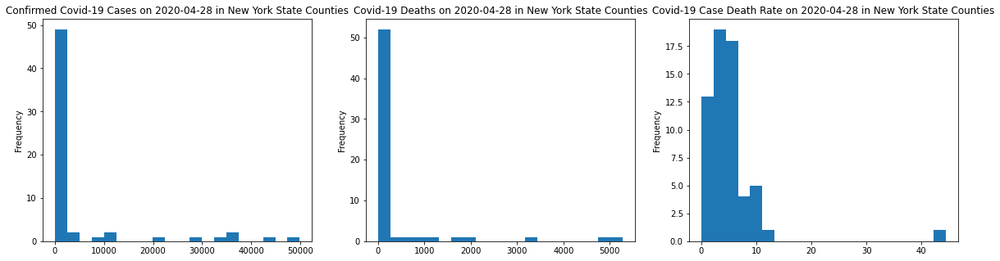

In [83]:
f,axs=plt.subplots(1,3,figsize=(20,5))
plt.subplot(1,3,1)
ny['confirmed'].plot.hist(bins=20)
plt.title("Confirmed Covid-19 Cases on 2020-04-28 in New York State Counties")
plt.subplot(1,3,2)
ny['deaths'].plot.hist(bins=20)
plt.title("Covid-19 Deaths on 2020-04-28 in New York State Counties")
plt.subplot(1,3,3)
ny['casedeathrate'].plot.hist(bins=20)
plt.title("Covid-19 Case Death Rate on 2020-04-28 in New York State Counties")

Text(0, 0.5, 'Number of Confirmed Cases')

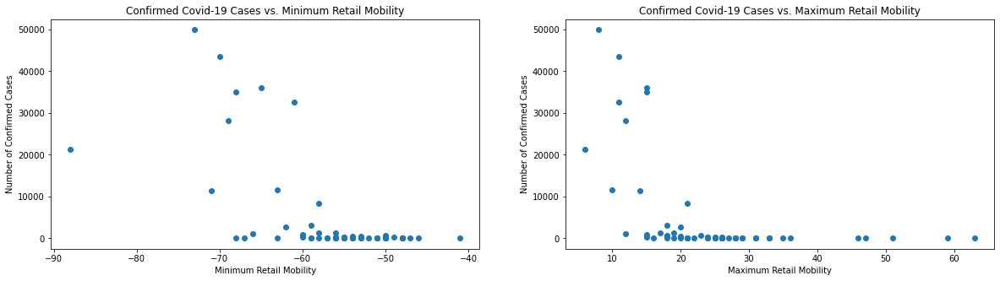

In [84]:
f,axs=plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.scatter(ny['retail_min'],ny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Minimum Retail Mobility")
plt.xlabel('Minimum Retail Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.subplot(1,2,2)
plt.scatter(ny['retail_max'],ny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Maximum Retail Mobility")
plt.xlabel('Maximum Retail Mobility')
plt.ylabel('Number of Confirmed Cases')

Text(0, 0.5, 'Number of Confirmed Cases')

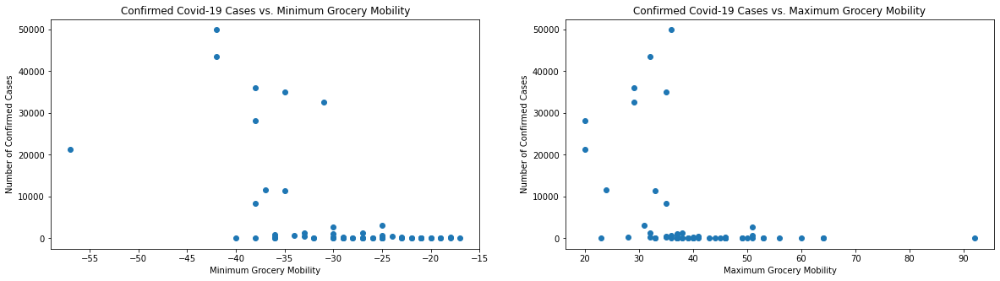

In [85]:
f,axs=plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.scatter(ny['grocery_min'],ny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Minimum Grocery Mobility")
plt.xlabel('Minimum Grocery Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.subplot(1,2,2)
plt.scatter(ny['grocery_max'],ny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Maximum Grocery Mobility")
plt.xlabel('Maximum Grocery Mobility')
plt.ylabel('Number of Confirmed Cases')

Text(0, 0.5, 'Number of Confirmed Cases')

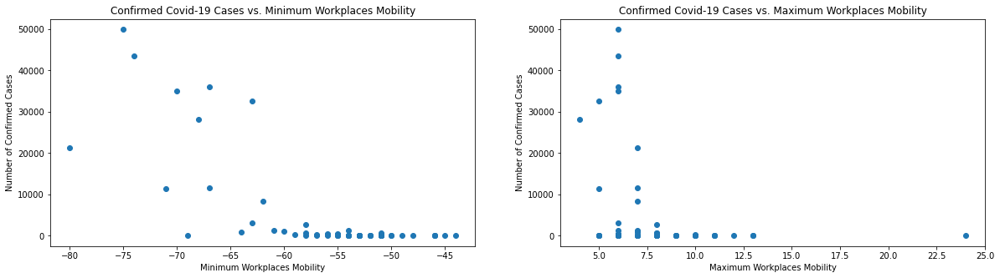

In [86]:
f,axs=plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.scatter(ny['workplaces_min'],ny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Minimum Workplaces Mobility")
plt.xlabel('Minimum Workplaces Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.subplot(1,2,2)
plt.scatter(ny['workplaces_max'],ny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Maximum Workplaces Mobility")
plt.xlabel('Maximum Workplaces Mobility')
plt.ylabel('Number of Confirmed Cases')

In [87]:
#Analysis excluding New York
Notny=csmh[csmh['st_abbr']!='NY']

Text(0.5, 1.0, 'Covid-19 Case Death Rate on 2020-04-28 in New York State Counties')

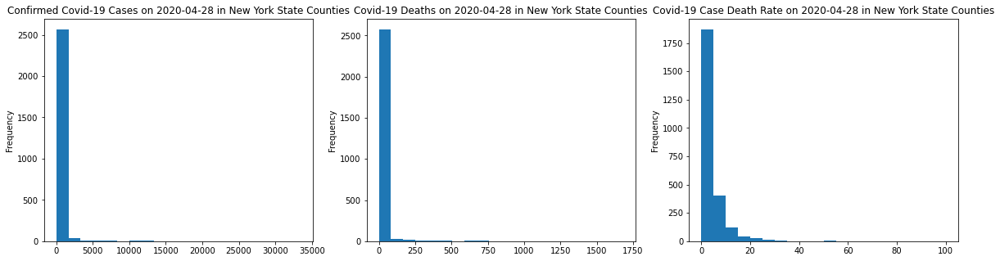

In [88]:
f,axs=plt.subplots(1,3,figsize=(20,5))
plt.subplot(1,3,1)
Notny['confirmed'].plot.hist(bins=20)
plt.title("Confirmed Covid-19 Cases on 2020-04-28 in New York State Counties")
plt.subplot(1,3,2)
Notny['deaths'].plot.hist(bins=20)
plt.title("Covid-19 Deaths on 2020-04-28 in New York State Counties")
plt.subplot(1,3,3)
Notny['casedeathrate'].plot.hist(bins=20)
plt.title("Covid-19 Case Death Rate on 2020-04-28 in New York State Counties")

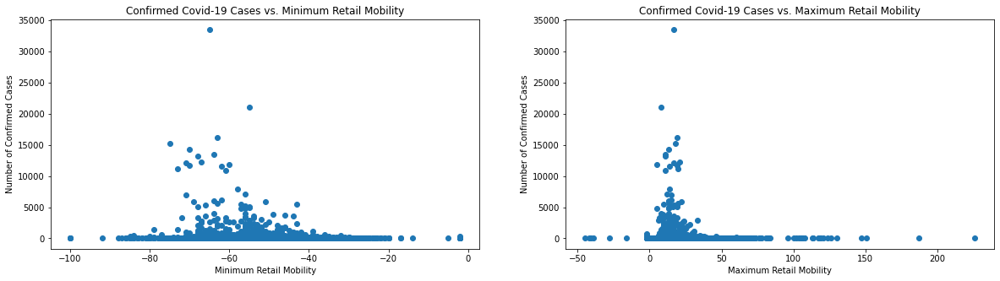

In [96]:
f,axs=plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.scatter(Notny['retail_min'],Notny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Minimum Retail Mobility")
plt.xlabel('Minimum Retail Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.subplot(1,2,2)
plt.scatter(Notny['retail_max'],Notny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Maximum Retail Mobility")
plt.xlabel('Maximum Retail Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.savefig('retail_case.png')

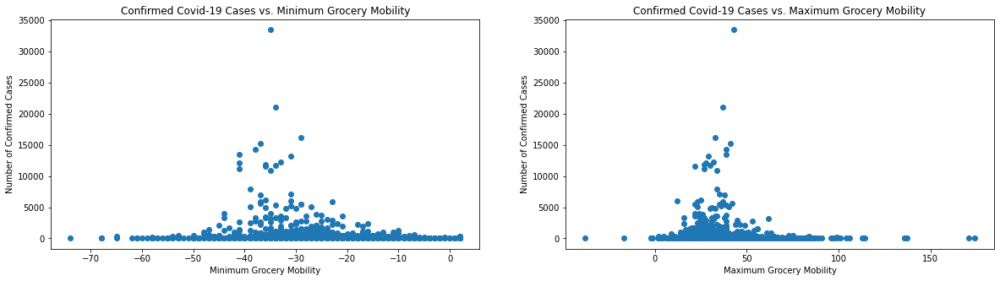

In [95]:
f,axs=plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.scatter(Notny['grocery_min'],Notny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Minimum Grocery Mobility")
plt.xlabel('Minimum Grocery Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.subplot(1,2,2)
plt.scatter(Notny['grocery_max'],Notny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Maximum Grocery Mobility")
plt.xlabel('Maximum Grocery Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.savefig('grocery_case.png')

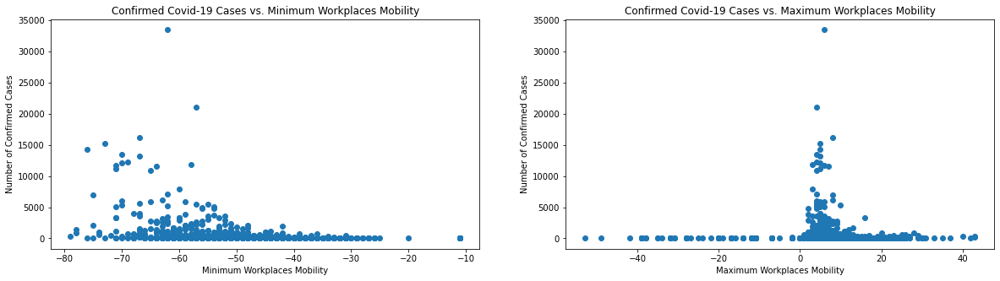

In [94]:
f,axs=plt.subplots(1,2,figsize=(20,5))
plt.subplot(1,2,1)
plt.scatter(Notny['workplaces_min'],Notny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Minimum Workplaces Mobility")
plt.xlabel('Minimum Workplaces Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.subplot(1,2,2)
plt.scatter(Notny['workplaces_max'],Notny['confirmed'])
plt.title("Confirmed Covid-19 Cases vs. Maximum Workplaces Mobility")
plt.xlabel('Maximum Workplaces Mobility')
plt.ylabel('Number of Confirmed Cases')
plt.savefig('workplace_case.png')